In [1]:
#import libraries
import os
import datetime
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msno
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
#pd.set_option('max_columns', 200)

In [2]:
jobs=pd.read_csv("https://aliopentrace.oss-cn-beijing.aliyuncs.com/v2020GPUTraces/pai_job_table.tar.gz")
task=pd.read_csv("https://aliopentrace.oss-cn-beijing.aliyuncs.com/v2020GPUTraces/pai_task_table.tar.gz")
instance=pd.read_csv("https://aliopentrace.oss-cn-beijing.aliyuncs.com/v2020GPUTraces/pai_instance_table.tar.gz")
sensor=pd.read_csv("https://aliopentrace.oss-cn-beijing.aliyuncs.com/v2020GPUTraces/pai_sensor_table.tar.gz")
group=pd.read_csv("https://aliopentrace.oss-cn-beijing.aliyuncs.com/v2020GPUTraces/pai_group_tag_table.tar.gz")
spec=pd.read_csv("https://aliopentrace.oss-cn-beijing.aliyuncs.com/v2020GPUTraces/pai_machine_spec.tar.gz")
metric=pd.read_csv("https://aliopentrace.oss-cn-beijing.aliyuncs.com/v2020GPUTraces/pai_machine_metric.tar.gz")

In [3]:
jobs.columns =['job_name', 'inst_id', 'user', 'status','start_time','end_time']
task.columns =['job_name','task_name','inst_num','status','start_time','end_time','plan_cpu','plan_mem','plan_gpu','gpu_type']
instance.columns =['job_name','task_name','inst_name','worker_name','inst_id','status','start_time','end_time','machine']
sensor.columns =['job_name','task_name','worker_name','inst_id','machine','gpu_name','cpu_usage','gpu_wrk_util','avg_mem','max_mem',
                 'avg_gpu_wrk_mem','max_gpu_wrk_mem','read','write','read_count','write_count']
group.columns =['inst_id','user','gpu_type_spec','group','workload']
spec.columns =['machine','gpu_type','cap_cpu','cap_mem','cap_gpu']
metric.columns =['worker_name','machine','start_time','end_time','machine_cpu_iowait','machine_cpu_kernel','machine_cpu_usr',
                 'machine_gpu','machine_load_1','machine_net_receive','machine_num_worker','machine_cpu']

## Jobs Dataset

**Exploring Jobs Dataset**

In [4]:
jobs.head()

,job_name,inst_id,user,status,start_time,end_time
0,9605ac7cc4c55a193fbe956b,e1cbdf28400847d65d00da4f0522ce7a43275fe9cb5d2a...,61d6b6dd5b15,Running,1097614.0,NaN
1,a2d8872d080eb634a42ea9a6,27ddabc2f7490279c6d5bd95c8a75e5c96d841c6030659...,61d6b6dd5b15,Running,1103820.0,NaN
2,e8baa72bfcd1b723cafab26a,70e4f598c8cdf40f24e0e7d3aba9a9dacde5342e1f2ffd...,61d6b6dd5b15,Terminated,1104396.0,1140852.0
3,4e87f469c73e13613908b658,5bb3500e7f1a42a9ce82544dad5f202547848e9727e221...,61d6b6dd5b15,Terminated,1109911.0,1233527.0
4,dcf1bd23bb296a8efb35902b,4fe3a2e132a1ffd068bf3d6dca3906d24a37f95df2c98e...,61d6b6dd5b15,Terminated,1129126.0,1129627.0


In [5]:
jobs.shape

(1055500, 6)

In [6]:
jobs.describe()

,start_time,end_time
count,1.051837e+06,7.590810e+05
mean,4.032090e+06,3.919303e+06
std,1.541977e+06,1.549664e+06
min,4.943190e+05,7.317720e+05
25%,2.780788e+06,2.591272e+06
50%,4.186308e+06,4.007783e+06
75%,5.491947e+06,5.280643e+06
max,6.451081e+06,6.451192e+06


In [7]:
jobs.describe(include='O')

,job_name,inst_id,user,status
count,1055500,1055500,1055500,1055500
unique,1055500,1055500,1433,4
top,9605ac7cc4c55a193fbe956b,e1cbdf28400847d65d00da4f0522ce7a43275fe9cb5d2a...,58540f191766,Terminated
freq,1,1,284867,732355


In [8]:
jobs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1055500 entries, 0 to 1055499
Data columns (total 6 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   job_name    1055500 non-null  object 
 1   inst_id     1055500 non-null  object 
 2   user        1055500 non-null  object 
 3   status      1055500 non-null  object 
 4   start_time  1051837 non-null  float64
 5   end_time    759081 non-null   float64
dtypes: float64(2), object(4)
memory usage: 48.3+ MB


**Handling Missing Values**

In [9]:
jobs.isnull().sum()

job_name           0
inst_id            0
user               0
status             0
start_time      3663
end_time      296419
dtype: int64

Here a thing to note is that there are missing values in the start and end time, and the job with waiting, running status, will logically don't have starting and ending time. and removing the missing values of start time and end time will remove the class "waiting" from the status as it have missing values in both column. But according our analysis we are focused on reducting the execution time which can only be calculated when we have both of the values (i.e. start time and end time). so regardless of the impact of removing missing values from the start and end time on the dataset size, we will remove them. as the data without the start and end time is not important in our analysis.

this same will also be applied to all of the dataset which contain start time and end time

In [10]:
jobs.dropna(inplace = True)

In [11]:
jobs.shape

(759036, 6)

**Checking Datatypes**

In [12]:
jobs.dtypes

job_name       object
inst_id        object
user           object
status         object
start_time    float64
end_time      float64
dtype: object

**Checking Total Unique Values**

In [13]:
jobs.nunique()

job_name      759036
inst_id       759036
user            1335
status             3
start_time    578559
end_time      665293
dtype: int64

**Checking Values Through Frequency Table**

In [14]:
jobs.apply(lambda x: print(x.value_counts(),"\n"))

e8baa72bfcd1b723cafab26a    1
e191c59629f8ecae9d5153ff    1
96c1f0fb92e14062a5124a20    1
329413e49074bdcc8824e222    1
3355679454b534be8a5fdd7f    1
                           ..
076baa59dd03ce664bef9470    1
6749b832ced73a7199bd1a61    1
743dafdca5be98cce1441349    1
3cd8703856976e78d49d40b3    1
ee3480523c1bf79b0d02c260    1
Name: job_name, Length: 759036, dtype: int64 

70e4f598c8cdf40f24e0e7d3aba9a9dacde5342e1f2ffd566d00e96ad273    1
61fc6740be24eba42dfa113f819e99019d038d44205084fe6a6b4888f965    1
0df603a142657db40e103cd379aa331bad27a72910280c3affa775211b0d    1
e6f8f0b0619d39d8c10ec45096d18bc15459c20e746cec6c61dcf6a4d08f    1
04b5b8df66ee3e0ed8efcb967215ab0783fc6d0709fa3046eb0138b8ac78    1
                                                               ..
f236e1b8b086a654f490f0342fdc6094377039806e74c3fc210ee59082cc    1
3f488107ba818f956407ba5c564f0dcce254e26d21fe9a5d3483a9934121    1
d3c0d9942d44a250634657c6528d772ccc4a94402fa1e5323a9696380b6a    1
861f516a9e15dff8083ad7bd226a8

job_name      None
inst_id       None
user          None
status        None
start_time    None
end_time      None
dtype: object

**Feature Encoding**

Beside the time columns and IDs there is only one column in the dataset that is the status, which have categorical values which needs to be encoded

In [15]:
jobs['status'].value_counts()

Terminated    732355
Failed         25620
Running         1061
Name: status, dtype: int64

In [16]:
jobs['status'] = jobs['status'].replace(['Terminated','Failed','Running'],[0,1,2])

In [17]:
jobs.head()

,job_name,inst_id,user,status,start_time,end_time
2,e8baa72bfcd1b723cafab26a,70e4f598c8cdf40f24e0e7d3aba9a9dacde5342e1f2ffd...,61d6b6dd5b15,0,1104396.0,1140852.0
3,4e87f469c73e13613908b658,5bb3500e7f1a42a9ce82544dad5f202547848e9727e221...,61d6b6dd5b15,0,1109911.0,1233527.0
4,dcf1bd23bb296a8efb35902b,4fe3a2e132a1ffd068bf3d6dca3906d24a37f95df2c98e...,61d6b6dd5b15,0,1129126.0,1129627.0
6,b74f75e2ac1c4c418bf87f3d,20df52e779cccafc07c57371d03c2cf22a93c57685828c...,61d6b6dd5b15,0,1150374.0,1150595.0
7,907b64330b1082339ae4e47e,5576beaf473bd6efaa9e4b4f0639c34fa8c9bbe9b372a1...,61d6b6dd5b15,0,1183478.0,1187493.0


## Task Dataset

**Exploring Task Dataset**

In [18]:
task.head()

,job_name,task_name,inst_num,status,start_time,end_time,plan_cpu,plan_mem,plan_gpu,gpu_type
0,455c3dec270f4777ad67721c,tensorflow,1.0,Terminated,3399583.0,3399732.0,600.0,29.296875,100.0,MISC
1,ba64aa2f0feff18428923e92,tensorflow,1.0,Terminated,2152271.0,2158213.0,600.0,29.296875,50.0,MISC
2,704783be2a4b7f88b8d2e4ee,worker,100.0,Failed,2172980.0,NaN,600.0,9.765625,10.0,MISC
3,bce3b9c55772f9d1e85fe796,PyTorchWorker,4.0,Failed,2374681.0,NaN,400.0,10.000000,100.0,V100
4,d45e51734a9bd73fb94fa849,xComputeWorker,1.0,Terminated,2359994.0,2360345.0,1000.0,19.550781,50.0,T4


In [19]:
task.shape

(1261049, 10)

In [20]:
task.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1261049 entries, 0 to 1261048
Data columns (total 10 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   job_name    1261049 non-null  object 
 1   task_name   1261049 non-null  object 
 2   inst_num    1260919 non-null  float64
 3   status      1261049 non-null  object 
 4   start_time  1257335 non-null  float64
 5   end_time    911488 non-null   float64
 6   plan_cpu    1242595 non-null  float64
 7   plan_mem    1242595 non-null  float64
 8   plan_gpu    1037084 non-null  float64
 9   gpu_type    1043311 non-null  object 
dtypes: float64(6), object(4)
memory usage: 96.2+ MB


In [21]:
task.describe()

,inst_num,start_time,end_time,plan_cpu,plan_mem,plan_gpu
count,1.260919e+06,1.257335e+06,9.114880e+05,1.242595e+06,1.242595e+06,1.037084e+06
mean,5.430073e+00,3.995090e+06,3.907678e+06,6.333741e+02,2.836157e+01,6.825531e+01
std,1.940674e+01,1.545314e+06,1.550822e+06,5.915084e+02,1.954900e+01,7.425881e+01
min,1.000000e+00,4.943190e+05,6.753180e+05,0.000000e+00,3.906250e-03,1.000000e+00
25%,1.000000e+00,2.726394e+06,2.576196e+06,6.000000e+02,2.929688e+01,2.500000e+01
50%,1.000000e+00,4.149048e+06,4.004433e+06,6.000000e+02,2.929688e+01,5.000000e+01
75%,1.000000e+00,5.431610e+06,5.272407e+06,6.000000e+02,2.929688e+01,1.000000e+02
max,1.200000e+03,6.451081e+06,6.451192e+06,9.000000e+03,4.000000e+02,8.000000e+02


In [22]:
task.describe(include='O')

,job_name,task_name,status,gpu_type
count,1261049,1261049,1261049,1043311
unique,1055500,24,4,5
top,3b01fa5a388e44a394b8858c,tensorflow,Terminated,MISC
freq,4,621414,885072,696280


**Handling Missing Values**

In [23]:
task.isnull().sum()

job_name           0
task_name          0
inst_num         130
status             0
start_time      3714
end_time      349561
plan_cpu       18454
plan_mem       18454
plan_gpu      223965
gpu_type      217738
dtype: int64

In [24]:
(task.isnull().sum()/task.shape[0])*100

job_name       0.000000
task_name      0.000000
inst_num       0.010309
status         0.000000
start_time     0.294517
end_time      27.719859
plan_cpu       1.463385
plan_mem       1.463385
plan_gpu      17.760214
gpu_type      17.266419
dtype: float64

Here beside the start and end time, we do have missing values in other columns. we will simply remove the rows with missing values are the percentage of missing value are all below 30. so it will not greatly impact the dataset size.

In [25]:
task.dropna(inplace=True)

In [26]:
task.shape

(737136, 10)

**Checking Datatypes**

In [27]:
task.dtypes

job_name       object
task_name      object
inst_num      float64
status         object
start_time    float64
end_time      float64
plan_cpu      float64
plan_mem      float64
plan_gpu      float64
gpu_type       object
dtype: object

**Checking Total Unique Values**

In [28]:
task.nunique()

job_name      719559
task_name         12
inst_num          87
status             3
start_time    557648
end_time      643972
plan_cpu          47
plan_mem         120
plan_gpu          28
gpu_type           5
dtype: int64

**Checking Values Through Frequency Table**

In [29]:
task.apply(lambda x: print(x.value_counts(),"\n"))

47f022d4e208f207e50e8f0b    2
bb4d65d0c66a5b2e1f77aa08    2
c27c31d3ee23ada7d63dd045    2
71131672ea0615eb8438733f    2
fcad8ee0a1ead4001960f250    2
                           ..
d106024655c71b0a944b605c    1
cceab3195a48ca25238c7152    1
1b2aa33ff5e152b458cd0ae3    1
c494ba067dd62d3b3165d8ea    1
906db91bc6f3321e94a6b472    1
Name: job_name, Length: 719559, dtype: int64 

tensorflow           406951
worker               214609
PyTorchWorker         70266
xComputeWorker        23918
evaluator             13322
ps                     5332
TVMTuneMain            1158
OssToVolumeWorker       658
OpenmpiWorker           611
JupyterTask             263
BladeMain                36
chief                    12
Name: task_name, dtype: int64 

1.0       581021
10.0       29337
20.0       15971
2.0        14392
50.0       10888
           ...  
34.0           1
39.0           1
1050.0         1
360.0          1
75.0           1
Name: inst_num, Length: 87, dtype: int64 

Terminated    732690
Runn

job_name      None
task_name     None
inst_num      None
status        None
start_time    None
end_time      None
plan_cpu      None
plan_mem      None
plan_gpu      None
gpu_type      None
dtype: object

**Feature Encoding**

Beside the time columns and IDs there is only one column in the dataset that is the status, which have categorical values which needs to be encoded

In [30]:
task['status'] = task['status'].replace(['Terminated','Failed','Running'],[0,1,2])
task['task_name'] = task['task_name'].replace(['tensorflow','worker','PyTorchWorker','xComputeWorker','evaluator','ps','TVMTuneMain','OssToVolumeWorker','OpenmpiWorker','JupyterTask',
                                               'BladeMain','chief'],[0,1,2,3,4,5,6,7,8,9,10,11])

task['gpu_type'] = task['gpu_type'].replace(['MISC','T4','P100','V100','V100M32'],[0,1,2,3,4])



In [31]:
task.head()

,job_name,task_name,inst_num,status,start_time,end_time,plan_cpu,plan_mem,plan_gpu,gpu_type
0,455c3dec270f4777ad67721c,0,1.0,0,3399583.0,3399732.0,600.0,29.296875,100.0,0
1,ba64aa2f0feff18428923e92,0,1.0,0,2152271.0,2158213.0,600.0,29.296875,50.0,0
4,d45e51734a9bd73fb94fa849,3,1.0,0,2359994.0,2360345.0,1000.0,19.550781,50.0,1
5,b609d0b21c1702836d822f03,0,1.0,0,2362291.0,2362331.0,600.0,29.296875,25.0,0
7,f4969adbe3a9142c6b7f2f76,0,1.0,0,1208483.0,1208543.0,600.0,29.296875,25.0,0


## instance Dataset

**Exploring instance Dataset**

In [32]:
instance.head()

,job_name,task_name,inst_name,worker_name,inst_id,status,start_time,end_time,machine
0,54670e2998350a9f0e4868d5,worker,92759a73039692b2d3e0929cadf55f5b07b40d6582c36f...,cbc1bc591c53301bceafa44dc626288fd92d2fc5dca438...,68889727c2257f702108d185e5eed342a39807a2893d4b...,Terminated,3272995.0,3273056.0,31dbf829549b10917e7193a6
1,54670e2998350a9f0e4868d5,worker,b3e42abde4c35da06ff4746802b82678b1bf56b28efaa1...,09d41bf627188adc004b2db7c0a47578325952cc3340af...,68889727c2257f702108d185e5eed342a39807a2893d4b...,Terminated,3272995.0,3273067.0,31dbf829549b10917e7193a6
2,54670e2998350a9f0e4868d5,worker,d0f2e1f76ff463bcd08302370cc2f9bf0ec1333a3b25e3...,1a631e8be3fd787c2891c15b9e9bac6df4f177efc9ec7b...,68889727c2257f702108d185e5eed342a39807a2893d4b...,Terminated,3272995.0,3273058.0,3765d45e2eca88d1d1da7cef
3,54670e2998350a9f0e4868d5,worker,0243b1305fd38f228634b23f69de5ed5ce801360eeffdc...,59aea81c00cccb5cd01ca2f7f72877d6bc73b427821986...,68889727c2257f702108d185e5eed342a39807a2893d4b...,Terminated,3272995.0,3273059.0,c0d6760f6248ea8260e36fa5
4,54670e2998350a9f0e4868d5,worker,37d701af4f93487bf928b19df63f989b48c8cf6c559513...,c3abefa8a4552e1f226eb8d35d44b94f512440be9adaa0...,68889727c2257f702108d185e5eed342a39807a2893d4b...,Terminated,3272995.0,3273060.0,c0d6760f6248ea8260e36fa5


In [33]:
instance.shape

(7522001, 9)

In [34]:
instance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7522001 entries, 0 to 7522000
Data columns (total 9 columns):
 #   Column       Dtype  
---  ------       -----  
 0   job_name     object 
 1   task_name    object 
 2   inst_name    object 
 3   worker_name  object 
 4   inst_id      object 
 5   status       object 
 6   start_time   float64
 7   end_time     float64
 8   machine      object 
dtypes: float64(2), object(7)
memory usage: 516.5+ MB


In [35]:
instance.describe()

,start_time,end_time
count,5.748533e+06,5.254419e+06
mean,3.873840e+06,3.924894e+06
std,1.556709e+06,1.523083e+06
min,4.943660e+05,5.327680e+05
25%,2.509789e+06,2.647342e+06
50%,3.909940e+06,4.004699e+06
75%,5.284903e+06,5.262644e+06
max,6.451090e+06,6.451192e+06


In [36]:
instance.describe(include='O')

,job_name,task_name,inst_name,worker_name,inst_id,status,machine
count,7522001,7522001,7522001,7190944,7522001,7522001,7190944
unique,1055432,24,6846882,7164357,1055432,6,1897
top,d429561ea0d5fec7914c299c,worker,e97bc8c475bd5606c3391082d0aea1a5029165539f5c6b...,c4bcecef4ea7222186134645a6d6ca1f40786ee90da66d...,540f16ef6cf66008e607249a23b3c2d17f9b31239157e9...,Terminated,07a757904c2974820f7f9dce
freq,6330,5044870,338,15,6330,4757370,60239


In [37]:
instance['status'].value_counts()

Terminated     4757370
Failed          969975
Running         809664
Interrupted     654022
Waiting         323840
Ready             7130
Name: status, dtype: int64

**Handling Missing Values**

In [38]:
instance.isnull().sum()

job_name             0
task_name            0
inst_name            0
worker_name     331057
inst_id              0
status               0
start_time     1773468
end_time       2267582
machine         331057
dtype: int64

In [39]:
(instance.isnull().sum()/instance.shape[0])*100

job_name        0.000000
task_name       0.000000
inst_name       0.000000
worker_name     4.401183
inst_id         0.000000
status          0.000000
start_time     23.577077
end_time       30.145994
machine         4.401183
dtype: float64

beside the start and end time we have missing values in other columns. and the percentage of missing values are below 5% so we will remove them.

In [40]:
instance.dropna(inplace=True)

In [41]:
instance.shape

(4758812, 9)

**Checking Datatypes**

In [42]:
instance.dtypes

job_name        object
task_name       object
inst_name       object
worker_name     object
inst_id         object
status          object
start_time     float64
end_time       float64
machine         object
dtype: object

**Checking Total Unique Values**

In [43]:
instance.nunique()

job_name        741190
task_name           17
inst_name      4758468
worker_name    4733708
inst_id         741190
status               2
start_time      969392
end_time       2458559
machine           1892
dtype: int64

**Checking Values Through Frequency Table**

In [44]:
instance.apply(lambda x: print(x.value_counts(),"\n"))

94b340f2cdedf37303d41bf2    1050
f8ce59e595168642575b09a3     949
e8c00aa396d3b9d842de5a6f     930
d58523cef086b263fb007236     930
1e64ad5c696cd10641cdc3c4     930
                            ... 
548c9ff0d47477fad8bb3836       1
2e37c91c13dc7d8b71d3881f       1
3a957e3257538f94ba981a00       1
307fe60f681f212e788066cc       1
fbcddffa9fa853342ebd6b49       1
Name: job_name, Length: 741190, dtype: int64 

worker               3140624
DecoderWorker         542560
tensorflow            406948
ps                    404968
PyTorchWorker         153916
OssToVolumeWorker      43320
xComputeWorker         29987
evaluator              14238
TensorboardTask         8166
MWorker                 4767
ReduceTask              3896
OpenmpiWorker           2009
JupyterTask             1444
TVMTuneMain             1158
OpenmpiTracker           536
chief                    239
BladeMain                 36
Name: task_name, dtype: int64 

a0f0d1988288be0402979d76aaba601d5e00edb8ecaf0d59ab669197f9e5    1

job_name       None
task_name      None
inst_name      None
worker_name    None
inst_id        None
status         None
start_time     None
end_time       None
machine        None
dtype: object

**Feature Encoding**

Beside the time columns and IDs there is only one column in the dataset that is the status, which have categorical values which needs to be encoded

In [45]:
instance['status'] = instance['status'].replace(['Terminated','Failed'],[0,1])
instance['task_name'] = instance['task_name'].replace(['tensorflow','worker','PyTorchWorker','xComputeWorker','evaluator','ps','TVMTuneMain','OssToVolumeWorker','OpenmpiWorker','JupyterTask',
                                               'BladeMain','chief','DecoderWorker','TensorboardTask','MWorker','ReduceTask','OpenmpiTracker'],[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16])



In [46]:
instance.head()

,job_name,task_name,inst_name,worker_name,inst_id,status,start_time,end_time,machine
0,54670e2998350a9f0e4868d5,1,92759a73039692b2d3e0929cadf55f5b07b40d6582c36f...,cbc1bc591c53301bceafa44dc626288fd92d2fc5dca438...,68889727c2257f702108d185e5eed342a39807a2893d4b...,0,3272995.0,3273056.0,31dbf829549b10917e7193a6
1,54670e2998350a9f0e4868d5,1,b3e42abde4c35da06ff4746802b82678b1bf56b28efaa1...,09d41bf627188adc004b2db7c0a47578325952cc3340af...,68889727c2257f702108d185e5eed342a39807a2893d4b...,0,3272995.0,3273067.0,31dbf829549b10917e7193a6
2,54670e2998350a9f0e4868d5,1,d0f2e1f76ff463bcd08302370cc2f9bf0ec1333a3b25e3...,1a631e8be3fd787c2891c15b9e9bac6df4f177efc9ec7b...,68889727c2257f702108d185e5eed342a39807a2893d4b...,0,3272995.0,3273058.0,3765d45e2eca88d1d1da7cef
3,54670e2998350a9f0e4868d5,1,0243b1305fd38f228634b23f69de5ed5ce801360eeffdc...,59aea81c00cccb5cd01ca2f7f72877d6bc73b427821986...,68889727c2257f702108d185e5eed342a39807a2893d4b...,0,3272995.0,3273059.0,c0d6760f6248ea8260e36fa5
4,54670e2998350a9f0e4868d5,1,37d701af4f93487bf928b19df63f989b48c8cf6c559513...,c3abefa8a4552e1f226eb8d35d44b94f512440be9adaa0...,68889727c2257f702108d185e5eed342a39807a2893d4b...,0,3272995.0,3273060.0,c0d6760f6248ea8260e36fa5


In [47]:
instance.dtypes

job_name        object
task_name        int64
inst_name       object
worker_name     object
inst_id         object
status           int64
start_time     float64
end_time       float64
machine         object
dtype: object

## Sensor Dataset

**Exploring Sensor Dataset**

In [48]:
sensor.head()

,job_name,task_name,worker_name,inst_id,machine,gpu_name,cpu_usage,gpu_wrk_util,avg_mem,max_mem,avg_gpu_wrk_mem,max_gpu_wrk_mem,read,write,read_count,write_count
0,c6acdbd813439f3ca63a9406,worker,fd1ee8bacf027604c2afdf89fc4edd843322b78376c9df...,dc6e6daefec62bc3729def7e15133c03b82a97a1457d68...,d84f5bc585e4ac5d24b30ec1,/dev/nvidia7,1.039332,0.000000,0.305684,0.343750,0.000000,0.000000,9.073576e+03,6.643213e+03,80.299497,47.311857
1,c6acdbd813439f3ca63a9406,worker,8885c53fd558926cb6aa44bbb7f40e242093778988c57d...,dc6e6daefec62bc3729def7e15133c03b82a97a1457d68...,b8dca09e0247ec64355414f9,/dev/nvidia2,0.287556,0.000000,0.345654,0.436523,0.000000,0.000000,4.852393e+03,6.681694e+03,50.627430,47.857114
2,3e4e9725920e7dc4a7a4ebdd,worker,8170c081a8d69cc228b9c2fa13a1c5e1190bf215296816...,ccc2b2c5742997e7ed0459efa6ec3db8b8e56e3f7fcd5f...,f7c1c4979c05bb7d20da65e4,/dev/nvidia7,83.771930,18.883333,5.817499,6.886719,2.065153,2.317383,1.504240e+08,5.082606e+07,7119.393443,75116.196721
3,3e4e9725920e7dc4a7a4ebdd,worker,e43f95191455f15365b40289c32b44648ce1e501331119...,ccc2b2c5742997e7ed0459efa6ec3db8b8e56e3f7fcd5f...,142a829a1e344f905fdcce42,/dev/nvidia2,112.711111,27.000000,5.494639,6.951172,2.001526,2.317383,1.854764e+08,6.311824e+07,9050.204082,93378.387755
4,3e4e9725920e7dc4a7a4ebdd,worker,8fa54171acbc9f16704c03f137ac053ede9a97432cfc94...,ccc2b2c5742997e7ed0459efa6ec3db8b8e56e3f7fcd5f...,5248e29b2b7f2b5f8b974608,/dev/nvidia2,108.769231,29.166667,5.652701,6.937500,1.963844,2.317383,2.091777e+08,7.192911e+07,9510.627907,107039.302326


In [49]:
sensor.shape

(3033231, 16)

In [50]:
sensor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3033231 entries, 0 to 3033230
Data columns (total 16 columns):
 #   Column           Dtype  
---  ------           -----  
 0   job_name         object 
 1   task_name        object 
 2   worker_name      object 
 3   inst_id          object 
 4   machine          object 
 5   gpu_name         object 
 6   cpu_usage        float64
 7   gpu_wrk_util     float64
 8   avg_mem          float64
 9   max_mem          float64
 10  avg_gpu_wrk_mem  float64
 11  max_gpu_wrk_mem  float64
 12  read             float64
 13  write            float64
 14  read_count       float64
 15  write_count      float64
dtypes: float64(10), object(6)
memory usage: 370.3+ MB


In [51]:
sensor.describe()

,cpu_usage,gpu_wrk_util,avg_mem,max_mem,avg_gpu_wrk_mem,max_gpu_wrk_mem,read,write,read_count,write_count
count,3.027402e+06,3.033231e+06,3.032014e+06,3.033231e+06,3.033231e+06,3.033231e+06,3.033228e+06,3.033228e+06,3.033228e+06,3.033228e+06
mean,2.588389e+02,1.045159e+01,5.542805e+00,1.069312e+01,1.724301e+00,2.338566e+00,2.610274e+08,6.184648e+07,1.124386e+04,8.940946e+03
std,5.680583e+02,3.000438e+01,1.062298e+01,5.770672e+01,6.105626e+00,7.716084e+00,6.745680e+08,2.623053e+08,2.735866e+04,8.220629e+04
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,5.720000e+01,0.000000e+00,7.321435e-01,1.410156e+00,1.219841e-01,1.865234e-01,1.339619e+07,2.073236e+06,1.613830e+03,8.103750e+02
50%,1.034935e+02,1.466667e+00,2.520955e+00,3.819336e+00,4.101289e-01,6.513672e-01,3.920780e+07,8.112421e+06,4.417091e+03,1.836084e+03
75%,2.386330e+02,9.753623e+00,6.420668e+00,1.018555e+01,1.834829e+00,2.502930e+00,1.462903e+08,2.972280e+07,9.643600e+03,5.117500e+03
max,9.206331e+03,7.920000e+02,3.916291e+02,2.757586e+03,2.532296e+02,2.536465e+02,6.189835e+10,4.928500e+10,8.557099e+06,1.339244e+07


In [52]:
sensor.describe(include='O')

,job_name,task_name,worker_name,inst_id,machine,gpu_name
count,3033231,3033231,3033231,3033231,3033231,3033231
unique,838678,14,3033231,838678,1737,8
top,f8ce59e595168642575b09a3,worker,fd1ee8bacf027604c2afdf89fc4edd843322b78376c9df...,13a5baff2c71fe05b2617db8a34e8779ea6898458f6b51...,851d52e9301aeafd051e2f2b,/dev/nvidia1
freq,559,2263799,1,559,14781,854560


**Handling Missing Values**

In [53]:
sensor.isnull().sum()

job_name              0
task_name             0
worker_name           0
inst_id               0
machine               0
gpu_name              0
cpu_usage          5829
gpu_wrk_util          0
avg_mem            1217
max_mem               0
avg_gpu_wrk_mem       0
max_gpu_wrk_mem       0
read                  3
write                 3
read_count            3
write_count           3
dtype: int64

In [54]:
(sensor.isnull().sum()/sensor.shape[0])*100

job_name           0.000000
task_name          0.000000
worker_name        0.000000
inst_id            0.000000
machine            0.000000
gpu_name           0.000000
cpu_usage          0.192171
gpu_wrk_util       0.000000
avg_mem            0.040122
max_mem            0.000000
avg_gpu_wrk_mem    0.000000
max_gpu_wrk_mem    0.000000
read               0.000099
write              0.000099
read_count         0.000099
write_count        0.000099
dtype: float64

the number of missing values are less then 1% so we will simply remove all of the missing values

In [55]:
sensor.dropna(inplace=True)

In [56]:
sensor.shape

(3027394, 16)

**Checking Datatypes**

In [57]:
sensor.dtypes

job_name            object
task_name           object
worker_name         object
inst_id             object
machine             object
gpu_name            object
cpu_usage          float64
gpu_wrk_util       float64
avg_mem            float64
max_mem            float64
avg_gpu_wrk_mem    float64
max_gpu_wrk_mem    float64
read               float64
write              float64
read_count         float64
write_count        float64
dtype: object

**Checking Total Unique Values**

In [58]:
sensor.nunique()

job_name            834478
task_name               14
worker_name        3027394
inst_id             834478
machine               1737
gpu_name                 8
cpu_usage          1823225
gpu_wrk_util       1080148
avg_mem            2326283
max_mem              94767
avg_gpu_wrk_mem    1802618
max_gpu_wrk_mem      17226
read               3026975
write              3024754
read_count         2668985
write_count        2482960
dtype: int64

**Checking Values Through Frequency Table**

In [59]:
sensor.apply(lambda x: print(x.value_counts(),"\n"))

f8ce59e595168642575b09a3    559
d1e941f0cccff94b4940e4b6    555
ac2ee955387615820f79837c    549
8784aee56781f729fde711de    544
efe1da39fee0a24be6261652    447
                           ... 
85af417c26713c305ab98c6b      1
09be4a1d3f87dd2aff188de3      1
b3c3417173de3341cd4a41be      1
1a4d274de228836c94f23621      1
ee3480523c1bf79b0d02c260      1
Name: job_name, Length: 834478, dtype: int64 

worker               2262292
tensorflow            509025
PyTorchWorker         214420
xComputeWorker         18634
evaluator               9773
OssToVolumeWorker       5614
ps                      3815
OpenmpiWorker           1723
TVMTuneMain              852
LeadingWorker            823
JupyterTask              378
BladeMain                 25
chief                     17
TransformGraph             3
Name: task_name, dtype: int64 

fd1ee8bacf027604c2afdf89fc4edd843322b78376c9df5fc15a2ff62ce5    1
9974d0b2476ce6feabf5969640e831186a28020b98aa4b204f62b96d0fbf    1
362a01440cf28144918815571657fca

job_name           None
task_name          None
worker_name        None
inst_id            None
machine            None
gpu_name           None
cpu_usage          None
gpu_wrk_util       None
avg_mem            None
max_mem            None
avg_gpu_wrk_mem    None
max_gpu_wrk_mem    None
read               None
write              None
read_count         None
write_count        None
dtype: object

In [60]:
# task_name    gpu_name

**Feature Encoding**

Beside the time columns and IDs there is only one column in the dataset that is the status, which have categorical values which needs to be encoded

In [61]:
sensor['gpu_name'].unique()

array(['/dev/nvidia7', '/dev/nvidia2', '/dev/nvidia6', '/dev/nvidia5',
       '/dev/nvidia4', '/dev/nvidia1', '/dev/nvidia3', '/dev/nvidia0'],
      dtype=object)

In [62]:
sensor['gpu_name'] = sensor['gpu_name'].replace(['/dev/nvidia7', '/dev/nvidia2', '/dev/nvidia6', '/dev/nvidia5',
       '/dev/nvidia4', '/dev/nvidia1', '/dev/nvidia3', '/dev/nvidia0'],[0,1,2,3,4,5,6,7])
sensor['task_name'] = sensor['task_name'].replace(['tensorflow','worker','PyTorchWorker','xComputeWorker','evaluator','ps','TVMTuneMain','OssToVolumeWorker','OpenmpiWorker','JupyterTask',
                                               'BladeMain','chief','TransformGraph','LeadingWorker'],[0,1,2,3,4,5,6,7,8,9,10,11,17,18])


In [63]:
sensor.head()

,job_name,task_name,worker_name,inst_id,machine,gpu_name,cpu_usage,gpu_wrk_util,avg_mem,max_mem,avg_gpu_wrk_mem,max_gpu_wrk_mem,read,write,read_count,write_count
0,c6acdbd813439f3ca63a9406,1,fd1ee8bacf027604c2afdf89fc4edd843322b78376c9df...,dc6e6daefec62bc3729def7e15133c03b82a97a1457d68...,d84f5bc585e4ac5d24b30ec1,0,1.039332,0.000000,0.305684,0.343750,0.000000,0.000000,9.073576e+03,6.643213e+03,80.299497,47.311857
1,c6acdbd813439f3ca63a9406,1,8885c53fd558926cb6aa44bbb7f40e242093778988c57d...,dc6e6daefec62bc3729def7e15133c03b82a97a1457d68...,b8dca09e0247ec64355414f9,1,0.287556,0.000000,0.345654,0.436523,0.000000,0.000000,4.852393e+03,6.681694e+03,50.627430,47.857114
2,3e4e9725920e7dc4a7a4ebdd,1,8170c081a8d69cc228b9c2fa13a1c5e1190bf215296816...,ccc2b2c5742997e7ed0459efa6ec3db8b8e56e3f7fcd5f...,f7c1c4979c05bb7d20da65e4,0,83.771930,18.883333,5.817499,6.886719,2.065153,2.317383,1.504240e+08,5.082606e+07,7119.393443,75116.196721
3,3e4e9725920e7dc4a7a4ebdd,1,e43f95191455f15365b40289c32b44648ce1e501331119...,ccc2b2c5742997e7ed0459efa6ec3db8b8e56e3f7fcd5f...,142a829a1e344f905fdcce42,1,112.711111,27.000000,5.494639,6.951172,2.001526,2.317383,1.854764e+08,6.311824e+07,9050.204082,93378.387755
4,3e4e9725920e7dc4a7a4ebdd,1,8fa54171acbc9f16704c03f137ac053ede9a97432cfc94...,ccc2b2c5742997e7ed0459efa6ec3db8b8e56e3f7fcd5f...,5248e29b2b7f2b5f8b974608,1,108.769231,29.166667,5.652701,6.937500,1.963844,2.317383,2.091777e+08,7.192911e+07,9510.627907,107039.302326


In [64]:
sensor.dtypes

job_name            object
task_name            int64
worker_name         object
inst_id             object
machine             object
gpu_name             int64
cpu_usage          float64
gpu_wrk_util       float64
avg_mem            float64
max_mem            float64
avg_gpu_wrk_mem    float64
max_gpu_wrk_mem    float64
read               float64
write              float64
read_count         float64
write_count        float64
dtype: object

## Group Dataset

**Exploring group Dataset**

In [65]:
group.head()

,inst_id,user,gpu_type_spec,group,workload
0,a8c39faded8b9a5b7436a47aff747835795cec39ef33c7...,58540f191766,NaN,81b1eed4c4b0463b7e5a154f7c42db1e,NaN
1,26bf18df11f3a989fa64ed808dc780ab24a7700941f7c1...,58540f191766,NaN,046437ed700bdf7434aa88503cc97a8d,NaN
2,a4fdd0229b8fcc227a8828daaa37500a29e125c1c38d1c...,58540f191766,NaN,d50ee406f93d51ccf485b415861dd8f5,NaN
3,4b4ab6c2a0691b35d8a9abb22ade8164b6be1bdb19c8a7...,58540f191766,NaN,c5ee81877b36fdb5dac829aab7b4146a,NaN
4,43f49cfa931142a679a8a1717920df55cd368d38b84f2a...,58540f191766,NaN,3f06f96790c1c22dcd6aea95263c546b,NaN


In [66]:
group.shape

(1055031, 5)

In [67]:
group.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1055031 entries, 0 to 1055030
Data columns (total 5 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   inst_id        1055031 non-null  object
 1   user           1055030 non-null  object
 2   gpu_type_spec  20633 non-null    object
 3   group          1055031 non-null  object
 4   workload       102798 non-null   object
dtypes: object(5)
memory usage: 40.2+ MB


In [68]:
group.describe()

,inst_id,user,gpu_type_spec,group,workload
count,1055031,1055030,20633,1055031,102798
unique,1055031,1431,5,316956,9
top,a8c39faded8b9a5b7436a47aff747835795cec39ef33c7...,58540f191766,P100,7755b21bfabe33c2399770fd4f3be0f9,bert
freq,1,284991,7653,22642,54887


In [69]:
group.describe(include='O')

,inst_id,user,gpu_type_spec,group,workload
count,1055031,1055030,20633,1055031,102798
unique,1055031,1431,5,316956,9
top,a8c39faded8b9a5b7436a47aff747835795cec39ef33c7...,58540f191766,P100,7755b21bfabe33c2399770fd4f3be0f9,bert
freq,1,284991,7653,22642,54887


**Handling Missing Values**

In [70]:
group.isnull().sum()

inst_id                0
user                   1
gpu_type_spec    1034398
group                  0
workload          952233
dtype: int64

In [71]:
(group.isnull().sum()/group.shape[0])*100

inst_id           0.000000
user              0.000095
gpu_type_spec    98.044323
group             0.000000
workload         90.256400
dtype: float64

Here the missing values of gpu_type_spec is 98% and missing values of workload is 90%. these columns cannot add value to any analysis due to the lack of data. so it is better to remove these columns.

In [72]:
group = group.dropna(subset=['user']).dropna(axis=1)

In [73]:
group

,inst_id,user,group
0,a8c39faded8b9a5b7436a47aff747835795cec39ef33c7...,58540f191766,81b1eed4c4b0463b7e5a154f7c42db1e
1,26bf18df11f3a989fa64ed808dc780ab24a7700941f7c1...,58540f191766,046437ed700bdf7434aa88503cc97a8d
2,a4fdd0229b8fcc227a8828daaa37500a29e125c1c38d1c...,58540f191766,d50ee406f93d51ccf485b415861dd8f5
3,4b4ab6c2a0691b35d8a9abb22ade8164b6be1bdb19c8a7...,58540f191766,c5ee81877b36fdb5dac829aab7b4146a
4,43f49cfa931142a679a8a1717920df55cd368d38b84f2a...,58540f191766,3f06f96790c1c22dcd6aea95263c546b
...,...,...,...
1055026,ae7ae8a7d32c1c56c59f306a3271bf7db0515b629a63be...,970063dba409,45c4314e564ea4d8504002e0144f9bc2
1055027,d072b733e39178d2f893e02ca46553b748afe9982789ff...,970063dba409,fef6c044de369ba2bf168077064de744
1055028,b81b2e0033aa5a5e591b908fb92ec79a0ecbd8c69f174e...,16808c52c63a,7953bc96f287acc3cc7113e1aac89eed
1055029,b8f69c79ceb61839dc74a742fddbb0e86f76b6d171f96c...,16808c52c63a,a98575bef3fc5450b8a8b531d60dee7b


In [74]:
group.shape

(1055030, 3)

**Checking Datatypes**

In [75]:
group.dtypes

inst_id    object
user       object
group      object
dtype: object

**Checking Total Unique Values**

In [76]:
group.nunique()

inst_id    1055030
user          1431
group       316955
dtype: int64

**Checking Values Through Frequency Table**

In [77]:
group.apply(lambda x: print(x.value_counts(),"\n"))

a8c39faded8b9a5b7436a47aff747835795cec39ef33c79aa656b04c7fc8    1
2f59023e5ded6e51000723f50cc877cb35e1c02f9cb4eb523ed9f2bd010a    1
4b0b965fc3684a6f271fe2d3f56febcd166c4e3fc456e37d5734a8bb9ddd    1
3ef078fa2f4589c86864872173d2ac3bb64e3ba416533187efb5e5b5d2d3    1
86140479d82d6e97995c90f9e8428f3fcbdc86cd90c8e3e9e15a589aaa37    1
                                                               ..
0894ddb9102a0c7e43e7b22778c54273398f811d0d39a4b964294b9a7e17    1
f6e16b49c6c66bfb3a69edd347bc823dc364e7873c7ff11a0e9194e9b568    1
6804a0850a12e48732d96f4c6e4ce74be57c0d4a70ab851dbaa49d4516df    1
d55c8edced94e4d864515c07c21b370783cfe3e7a79c27f22bdcba53d682    1
701711437f4c950197e77f3c04ca23fa3bb6ac3c13dd254d7b8963360b5a    1
Name: inst_id, Length: 1055030, dtype: int64 

58540f191766    284991
d4d51aca8806     51907
5b1345f03aa1     51248
0ed3eacdff35     37048
ebba56ec23b9     33453
                 ...  
357670f93f60         1
805465d54be5         1
ab989a807647         1
ce98616128a5        

inst_id    None
user       None
group      None
dtype: object

**Feature Encoding**

In [77]:
from sklearn.preprocessing import LabelEncoder
group['group'] = label_encoder.fit_transform(group['group'])

## Spec Dataset

**Exploring spec Dataset**

In [78]:
spec.head()

,machine,gpu_type,cap_cpu,cap_mem,cap_gpu
0,75c536d5ba60528b3ef3ae40,CPU,96,512,0
1,6265a99de1a50cc6f1b03602,CPU,96,512,0
2,cb5c703eae0a123ad25e480d,CPU,96,512,0
3,fc6921f2af20c5337c43d4a9,CPU,96,512,0
4,49caad91753d3c004cde7b66,CPU,96,512,0


In [79]:
spec.shape

(1896, 5)

In [80]:
spec.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1896 entries, 0 to 1895
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   machine   1896 non-null   object
 1   gpu_type  1896 non-null   object
 2   cap_cpu   1896 non-null   int64 
 3   cap_mem   1896 non-null   int64 
 4   cap_gpu   1896 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 74.2+ KB


In [81]:
spec.describe()

,cap_cpu,cap_mem,cap_gpu
count,1896.000000,1896.000000,1896.000000
mean,82.531646,499.848101,3.555907
std,15.802610,37.530218,2.758730
min,64.000000,384.000000,0.000000
25%,64.000000,512.000000,2.000000
50%,96.000000,512.000000,2.000000
75%,96.000000,512.000000,8.000000
max,96.000000,512.000000,8.000000


In [82]:
spec.describe(include='O')

,machine,gpu_type
count,1896,1896
unique,1896,6
top,75c536d5ba60528b3ef3ae40,P100
freq,1,798


**Handling Missing Values**

In [83]:
spec.isnull().sum()

machine     0
gpu_type    0
cap_cpu     0
cap_mem     0
cap_gpu     0
dtype: int64

In [84]:
(spec.isnull().sum()/spec.shape[0])*100

machine     0.0
gpu_type    0.0
cap_cpu     0.0
cap_mem     0.0
cap_gpu     0.0
dtype: float64

In [85]:
spec.shape

(1896, 5)

**Checking Datatypes**

In [86]:
spec.dtypes

machine     object
gpu_type    object
cap_cpu      int64
cap_mem      int64
cap_gpu      int64
dtype: object

In [87]:
# from datetime import datetime
# jobs['start_time'].apply(lambda x: datetime.fromtimestamp(x))

**Checking Total Unique Values**

In [88]:
spec.nunique()

machine     1896
gpu_type       6
cap_cpu        2
cap_mem        2
cap_gpu        3
dtype: int64

**Checking Values Through Frequency Table**

In [89]:
spec.apply(lambda x: print(x.value_counts(),"\n"))

75c536d5ba60528b3ef3ae40    1
999c5cbde1ce49ec0f6a9293    1
354d602e9e604a13d342850d    1
b3bb72f1a9d83834b7459073    1
d0ecefb562ff5eaf96927d49    1
                           ..
091874591c93b7fa72dc8a54    1
f504353e74e59fffdc668d31    1
95ae29d45198011659d71351    1
e251b20ea2e0819ecb8c9a78    1
a12e33726524543425a94398    1
Name: machine, Length: 1896, dtype: int64 

P100       798
T4         497
MISC       280
V100M32    135
V100       104
CPU         82
Name: gpu_type, dtype: int64 

96    1098
64     798
Name: cap_cpu, dtype: int64 

512    1716
384     180
Name: cap_mem, dtype: int64 

2    1295
8     519
0      82
Name: cap_gpu, dtype: int64 



machine     None
gpu_type    None
cap_cpu     None
cap_mem     None
cap_gpu     None
dtype: object

**Feature Encoding**

Beside the time columns and IDs there is only one column in the dataset that is the status, which have categorical values which needs to be encoded

In [90]:

spec['gpu_type'] = spec['gpu_type'].replace(['MISC','T4','P100','V100','V100M32','CPU'],[0,1,2,3,4,5])

In [91]:
spec.head()

,machine,gpu_type,cap_cpu,cap_mem,cap_gpu
0,75c536d5ba60528b3ef3ae40,5,96,512,0
1,6265a99de1a50cc6f1b03602,5,96,512,0
2,cb5c703eae0a123ad25e480d,5,96,512,0
3,fc6921f2af20c5337c43d4a9,5,96,512,0
4,49caad91753d3c004cde7b66,5,96,512,0


In [92]:
spec.dtypes

machine     object
gpu_type     int64
cap_cpu      int64
cap_mem      int64
cap_gpu      int64
dtype: object

## Metric Dataset

**Exploring Metric Dataset**

In [93]:
metric.head()

,worker_name,machine,start_time,end_time,machine_cpu_iowait,machine_cpu_kernel,machine_cpu_usr,machine_gpu,machine_load_1,machine_net_receive,machine_num_worker,machine_cpu
0,9b69319eb5d19b4ea2514fcb4d761c3d00be925b65f529...,5248e29b2b7f2b5f8b974608,2806218,2806331,0.006080,9.226264,40.158927,192.551088,89.731273,3.845883e+08,15.672816,49.391271
1,b37cd5d848323f23352464f71d3c27ef4796532ee09d59...,5248e29b2b7f2b5f8b974608,3084090,3084411,0.000699,10.140853,40.807522,150.497242,72.377214,7.027994e+08,14.234469,50.949074
2,8a3db37b3795c7c753963d0ef966df9703d39b9f918e1a...,5248e29b2b7f2b5f8b974608,2119980,2134354,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f114ac24745ec00da7107387afc99ed7cd8132530e8ef7...,5248e29b2b7f2b5f8b974608,2164803,2171278,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f371163f543306235dc7acce843554dc21ab1ab70d94ba...,5248e29b2b7f2b5f8b974608,2171306,2181015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [94]:
metric.shape

(2009422, 12)

In [95]:
metric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2009422 entries, 0 to 2009421
Data columns (total 12 columns):
 #   Column               Dtype  
---  ------               -----  
 0   worker_name          object 
 1   machine              object 
 2   start_time           int64  
 3   end_time             int64  
 4   machine_cpu_iowait   float64
 5   machine_cpu_kernel   float64
 6   machine_cpu_usr      float64
 7   machine_gpu          float64
 8   machine_load_1       float64
 9   machine_net_receive  float64
 10  machine_num_worker   float64
 11  machine_cpu          float64
dtypes: float64(8), int64(2), object(2)
memory usage: 184.0+ MB


In [96]:
metric.describe()

,start_time,end_time,machine_cpu_iowait,machine_cpu_kernel,machine_cpu_usr,machine_gpu,machine_load_1,machine_net_receive,machine_num_worker,machine_cpu
count,2.009422e+06,2.009422e+06,918905.000000,1.728735e+06,1.777328e+06,1.767929e+06,1.740879e+06,1.791275e+06,1.714165e+06,883528.000000
mean,4.360319e+06,4.366969e+06,0.004486,9.508965e+00,2.968448e+01,1.351029e+02,8.401768e+01,4.412696e+08,1.178863e+01,27.609001
std,1.224316e+06,1.223929e+06,0.006931,7.465272e+00,1.585823e+01,9.657316e+01,1.136024e+02,3.061974e+08,6.757540e+00,18.661546
min,1.589093e+06,2.081404e+06,0.000038,3.432332e-01,3.180714e-01,0.000000e+00,5.274177e-01,2.286787e+06,0.000000e+00,0.721013
25%,3.359566e+06,3.362212e+06,0.002369,3.491728e+00,1.640286e+01,5.370175e+01,1.785082e+01,1.813082e+08,4.903702e+00,13.392983
50%,4.420860e+06,4.428780e+06,0.002950,8.829629e+00,3.039273e+01,1.243728e+02,5.232856e+01,4.325026e+08,1.288472e+01,22.794215
75%,5.416208e+06,5.422979e+06,0.004468,1.239376e+01,4.108505e+01,1.914276e+02,1.029664e+02,6.252959e+08,1.771518e+01,39.027410
max,6.451090e+06,6.451192e+06,0.338694,8.181679e+01,9.495882e+01,7.874127e+02,3.073250e+03,4.314783e+09,2.974975e+01,99.272349


In [97]:
metric.describe(include='O')

,worker_name,machine
count,2009422,2009422
unique,2009420,1720
top,d6fd4b4360e806c75e93c38771cd2ecf47c86b6cec7131...,2b8c83862a4bd55f90593014
freq,2,9919


**Handling Missing Values**

In [98]:
metric.isnull().sum()

worker_name                  0
machine                      0
start_time                   0
end_time                     0
machine_cpu_iowait     1090517
machine_cpu_kernel      280687
machine_cpu_usr         232094
machine_gpu             241493
machine_load_1          268543
machine_net_receive     218147
machine_num_worker      295257
machine_cpu            1125894
dtype: int64

In [99]:
(metric.isnull().sum()/metric.shape[0])*100

worker_name             0.000000
machine                 0.000000
start_time              0.000000
end_time                0.000000
machine_cpu_iowait     54.270183
machine_cpu_kernel     13.968544
machine_cpu_usr        11.550287
machine_gpu            12.018033
machine_load_1         13.364191
machine_net_receive    10.856206
machine_num_worker     14.693628
machine_cpu            56.030739
dtype: float64

Here 2 columns that is machine_cpu_iowait and machine_cpu have more then 50% missing values, so removing the missing rows of these columns will greatly impact the size of the data. more then half of the data will be removed. so its better to remove these 2 columns. and remove the missing rows of the other columns

In [100]:
metric_df = metric.dropna(subset=['machine_cpu_kernel','machine_cpu_usr','machine_gpu','machine_load_1','machine_net_receive','machine_num_worker']).dropna(axis=1)

In [101]:
metric_df.shape

(1406189, 10)

**Checking Datatypes**

In [102]:
metric_df.dtypes

worker_name             object
machine                 object
start_time               int64
end_time                 int64
machine_cpu_kernel     float64
machine_cpu_usr        float64
machine_gpu            float64
machine_load_1         float64
machine_net_receive    float64
machine_num_worker     float64
dtype: object

**Checking Total Unique Values**

In [103]:
metric_df.nunique()

worker_name            1406189
machine                   1562
start_time              428557
end_time               1022912
machine_cpu_kernel     1327380
machine_cpu_usr        1327426
machine_gpu            1316762
machine_load_1         1327401
machine_net_receive    1327434
machine_num_worker     1286346
dtype: int64

**Checking Values Through Frequency Table**

In [104]:
metric_df.apply(lambda x: print(x.value_counts(),"\n"))

9b69319eb5d19b4ea2514fcb4d761c3d00be925b65f52964197052de6c1e    1
bc5562b8d6dc1a4da345aaa70983a94c6305b2e39ba81d12a01a422db913    1
8e30f843b3a1fc008ca4e5c978d1883d4ec3e2d5b84909986ba038311518    1
9de28dc5c04301789aaff0afa0cf9c944f97a4d546047fc2fb25d7991eea    1
60c61fd8d885c83b822f05965adda23de405b06f24a33509bce7d08f66cc    1
                                                               ..
71f883cc7dde694a10f15ed124cfbbbe1dcb13f75539c8dc515fd2ed6ae2    1
ae7d000de5cc40d77ad554ad2996fbcd4997e2dc10a6ae7cf9600bfbba3b    1
2572d333e90a558efc4407d3d1850ac580aa814e94a5d0039df73a56f0ea    1
14f61588927dd9c16433f8a18148aa729634d7422d12501151e132e84bbf    1
2c7ae129e04c387861e433a875c83a2e990677790ef3a5ce1533e726e22a    1
Name: worker_name, Length: 1406189, dtype: int64 

851d52e9301aeafd051e2f2b    8914
3b127c8abb4f26e57b34af81    7030
98b8bb491c96170d88f95a6c    6810
9d860e17c50f8226eb853943    6629
edd7369d3763a75aebf18a8a    6589
                            ... 
7de211c19601b2c009039e9a 

worker_name            None
machine                None
start_time             None
end_time               None
machine_cpu_kernel     None
machine_cpu_usr        None
machine_gpu            None
machine_load_1         None
machine_net_receive    None
machine_num_worker     None
dtype: object

## **Merging DataFrames**

to do an outer join on the tables **metric and instance**.

**common columns used**:

worker_name: worker name; same as the entry in pai_instance_table.
machine: machine name; same as the entry in pai_instance_table.
start_time: timestamp of instance launch time; same as the entry in pai_instance_table.
end_time: timestamp of instance completion; same as the entry in pai_instance_table.

In [105]:
#common columns

np.intersect1d(metric_df.columns, instance.columns)

array(['end_time', 'machine', 'start_time', 'worker_name'], dtype=object)

In [106]:
metric_instance=pd.merge(metric_df,instance,how="outer", on=["worker_name", "machine","start_time","end_time"])

In [107]:
metric_instance.head()

,worker_name,machine,start_time,end_time,machine_cpu_kernel,machine_cpu_usr,machine_gpu,machine_load_1,machine_net_receive,machine_num_worker,job_name,task_name,inst_name,inst_id,status
0,9b69319eb5d19b4ea2514fcb4d761c3d00be925b65f529...,5248e29b2b7f2b5f8b974608,2806218.0,2806331.0,9.226264,40.158927,192.551088,89.731273,3.845883e+08,15.672816,bf38872c1478a8a4e17e8b32,1.0,148e5cc1170ba717e49fb649325783b3cbc1faabea594c...,bca30efa9f33e644ae91bd28c000da66b624b63d487f9b...,0.0
1,b37cd5d848323f23352464f71d3c27ef4796532ee09d59...,5248e29b2b7f2b5f8b974608,3084090.0,3084411.0,10.140853,40.807522,150.497242,72.377214,7.027994e+08,14.234469,2c917b5c87d226888ce43f75,1.0,6ec6fc6ca7ec5d49493ba87e1663e32a4ff4bf8a45469e...,4ccfccc18d0397bc593f3b2aa15400e7a1a606ba968b1c...,0.0
2,7f1f4d76602d2071cb959a7ec47873e1007bee8046b2dd...,5248e29b2b7f2b5f8b974608,2659273.0,2673034.0,7.683578,30.595101,498.010627,74.101198,3.143130e+08,12.209609,f1de9110885dc2182eb19bb3,1.0,ca30956ceb05ece2d596957b7a9f143e6926e09eb3a001...,29ec7c7bff0fac3b60c08d3434c18c6c67b2154675969c...,0.0
3,6ecadb953221add9491f244051114c7a2c4d5c63b7ffe3...,5248e29b2b7f2b5f8b974608,2660994.0,2674496.0,7.427590,29.311445,494.623959,64.539163,3.187836e+08,12.199445,7bf7d7446cb41492fb49c245,1.0,c4188864272b2678ee011ff63b1abc6cff73818d35193a...,26721abebcf272959849c771baa36271cef900487c3ab0...,0.0
4,66ae3b379970ed9246766f1e7b473b5913f10917ae0aed...,5248e29b2b7f2b5f8b974608,2826419.0,2834615.0,8.428983,37.379467,231.566358,79.317289,4.350458e+08,15.794257,348159955a0bf1741af3324e,1.0,7fbacd9a48b76d7632954e58737618972b767663f3d5f2...,bbf525e37499cb58a2b5b1e4a0759a80d5232f76b08355...,0.0


In [108]:
metric_instance.isna().mean().round(4) * 100

worker_name             0.00
machine                 0.00
start_time              0.00
end_time                0.00
machine_cpu_kernel     70.47
machine_cpu_usr        70.47
machine_gpu            70.47
machine_load_1         70.47
machine_net_receive    70.47
machine_num_worker     70.47
job_name                0.07
task_name               0.07
inst_name               0.07
inst_id                 0.07
status                  0.07
dtype: float64

We see that machine_cpu_kernel, machine_cpu_usr, machine_gpu, machine_load_1, machine_net_receive, and machine_num_worker have 70% values missing.

so we will remove them

In [109]:
metric_instance = metric_instance.dropna()

In [110]:
#remove duplicates:

metric_instance=metric_instance.drop_duplicates(subset=['machine'])

**spec table** can be joined either with the **instance table** or the task table

**common columns for each table:**

machine: machine name; same as the entry in pai_instance_table.

gpu_type: GPU type; same as the entry in pai_task_table.

I'm going to use instance. It really doesn't matter which one we choose at this point.

In [111]:
#common columns

np.intersect1d(spec.columns, instance.columns)

array(['machine'], dtype=object)

In [112]:
spec_instance=pd.merge(spec,instance,how="outer", on=["machine"])

In [113]:
spec_instance.isna().mean().round(4) * 100

machine        0.00
gpu_type       0.02
cap_cpu        0.02
cap_mem        0.02
cap_gpu        0.02
job_name       0.00
task_name      0.00
inst_name      0.00
worker_name    0.00
inst_id        0.00
status         0.00
start_time     0.00
end_time       0.00
dtype: float64

In [114]:
spec_instance = spec_instance.dropna()

In [115]:
#remove duplicates:

spec_instance=spec_instance.drop_duplicates(subset=['machine'])

**group table**  can be joined with the **jobs table**.

**Common columns:**

inst_id: please treat or revise it as job_id, since each job_name corresponds to one inst_id. Same as the entry in pai_job_table

user: user name; same as the entry in pai_job_table.

gpu_type_spec: being empty if the instance does not specify GPU type requirements, else being one of the gpu_type in pai_task_table.

In [116]:
#common columns

np.intersect1d(group.columns, jobs.columns)

array(['inst_id', 'user'], dtype=object)

In [117]:
group_jobs=pd.merge(group,jobs,how="outer", on=["inst_id","user"])

In [118]:
group_jobs.isna().mean().round(4) * 100

inst_id        0.00
user           0.00
group          0.08
job_name      28.11
status        28.11
start_time    28.11
end_time      28.11
dtype: float64

In [119]:
group_jobs = group_jobs.dropna()

In [120]:
#remove duplicates:

group_jobs=group_jobs.drop_duplicates(subset=['inst_id'])

**sensor table ** can be joined with the **jobs table**, **instance table** or **task table**. I'll go with the jobs table for now.

**Common columns:**

job_name: job name; same as the entry in pai_job_table.

inst_id: please treat or revise it as job_id, since each job_name corresponds to one inst_id. Same as the entry in pai_job_table

In [121]:
#common columns

np.intersect1d(sensor.columns, jobs.columns)

array(['inst_id', 'job_name'], dtype=object)

In [122]:
sensor_jobs=pd.merge(sensor,jobs,how="outer", on=["job_name","inst_id"])

In [123]:
sensor_jobs.isna().mean().round(4) * 100

job_name            0.00
task_name           5.15
worker_name         5.15
inst_id             0.00
machine             5.15
gpu_name            5.15
cpu_usage           5.15
gpu_wrk_util        5.15
avg_mem             5.15
max_mem             5.15
avg_gpu_wrk_mem     5.15
max_gpu_wrk_mem     5.15
read                5.15
write               5.15
read_count          5.15
write_count         5.15
user               21.59
status             21.59
start_time         21.59
end_time           21.59
dtype: float64

In [124]:
# Keep in mind, by dropping the missing values here, we are losing the most data. IT is okay for our first run of the model, but we may need to come back to impute the values in status and user
sensor_jobs = sensor_jobs.dropna()

In [125]:
#remove duplicates:

sensor_jobs=sensor_jobs.drop_duplicates(subset=['inst_id'])

**instance table** can be joined to **jobs, task, sensor or metric**.

**common column: **

job_name: job name; same as the entry in pai_job_table.

inst_id: please treat or revise it as job_id, since each job_name corresponds to one inst_id; same as the entry in pai_job_table


However, I'm going to combine metric_instance with spec instance, to start building our final dataframe.

Common column:

machine: the name of machine that the instance resides on, to be joined with machine in pai_machine_spec and pai_machine_metric.

In [126]:
#common columns

np.intersect1d(metric_instance.columns, spec_instance.columns)

array(['end_time', 'inst_id', 'inst_name', 'job_name', 'machine',
       'start_time', 'status', 'task_name', 'worker_name'], dtype=object)

In [127]:
instance_jobs=pd.merge(metric_instance,spec_instance,how="outer", on=['end_time', 'inst_id', 'inst_name', 'job_name', 'machine','start_time', 'status', 'task_name', 'worker_name'])

In [128]:
instance_jobs.isna().mean().round(4) * 100

worker_name             0.00
machine                 0.00
start_time              0.00
end_time                0.00
machine_cpu_kernel     54.69
machine_cpu_usr        54.69
machine_gpu            54.69
machine_load_1         54.69
machine_net_receive    54.69
machine_num_worker     54.69
job_name                0.00
task_name               0.00
inst_name               0.00
inst_id                 0.00
status                  0.00
gpu_type               45.14
cap_cpu                45.14
cap_mem                45.14
cap_gpu                45.14
dtype: float64

In [129]:
instance_jobs = instance_jobs.dropna()

In [130]:
#remove duplicates:

instance_jobs=instance_jobs.drop_duplicates(subset=['machine'])

**task table **can be joined to the **job table**.

**Common column:**

job_name: job name; same as the entry in pai_job_table.

In [131]:
#common columns

np.intersect1d(task.columns, jobs.columns)

array(['end_time', 'job_name', 'start_time', 'status'], dtype=object)

In [132]:
task_jobs=pd.merge(task,jobs,how="outer", on=['end_time', 'job_name', 'start_time', 'status'])

In [133]:
task_jobs.isna().mean().round(4) * 100

job_name       0.00
task_name     17.73
inst_num      17.73
status         0.00
start_time     0.00
end_time       0.00
plan_cpu      17.73
plan_mem      17.73
plan_gpu      17.73
gpu_type      17.73
inst_id       15.29
user          15.29
dtype: float64

In [134]:
task_jobs = task_jobs.dropna()

In [135]:
#remove duplicates:

task_jobs.drop_duplicates(subset=['inst_id'])

,job_name,task_name,inst_num,status,start_time,end_time,plan_cpu,plan_mem,plan_gpu,gpu_type,inst_id,user
0,455c3dec270f4777ad67721c,0.0,1.0,0,3399583.0,3399732.0,600.0,29.296875,100.0,0.0,d94b4b01a6dd6c1865972cd628abe206422143ef37e6d4...,ebba56ec23b9
1,ba64aa2f0feff18428923e92,0.0,1.0,0,2152271.0,2158213.0,600.0,29.296875,50.0,0.0,af71dfe31db0378561e1bea2c26605f67cb7611f0d3866...,de69ddc1064e
2,d45e51734a9bd73fb94fa849,3.0,1.0,0,2359994.0,2360345.0,1000.0,19.550781,50.0,1.0,b41f0a87eba4a15f63ca1e0a881921036522a70760a993...,c4cbaac9966d
3,b609d0b21c1702836d822f03,0.0,1.0,0,2362291.0,2362331.0,600.0,29.296875,25.0,0.0,cb177eaca0c98d42513f19dc593586f5768569b059e7a9...,a7c4e1d6c98c
4,f4969adbe3a9142c6b7f2f76,0.0,1.0,0,1208483.0,1208543.0,600.0,29.296875,25.0,0.0,a748fcdd2e362930ee5e5aaec3261cd17a37e3bece62ff...,ebba56ec23b9
...,...,...,...,...,...,...,...,...,...,...,...,...
737130,337f51b9742e8a65d0918985,2.0,1.0,0,4725805.0,4726611.0,1600.0,29.296875,100.0,4.0,3386a1e9040b0a06a6c1eaee5c29582c4efcd429f9ae59...,58540f191766
737131,faaa9ad45b3a9c05c02b5bfd,2.0,1.0,0,4787176.0,4790407.0,1800.0,58.593750,100.0,2.0,ed39a8ad3c3fee50bdde97aee1af0620eeaf7361034b2e...,dcbd95c6bf0f
737132,41c020ad01b1d9e14a9db21e,0.0,1.0,0,4795471.0,4796254.0,600.0,29.296875,25.0,1.0,67c530d56d08d2918ab226b1bef28a4c15f43066512c59...,e953ad4cd5b7
737134,31271edf22fc09d66691b610,0.0,1.0,0,4725236.0,4727490.0,100.0,29.296875,25.0,0.0,c784fb15b3236a8dc792b0eab24f5f473b03d25d76dc1e...,58540f191766


In [136]:
#common columns

np.intersect1d(instance_jobs.columns, group_jobs.columns)

array(['end_time', 'inst_id', 'job_name', 'start_time', 'status'],
      dtype=object)

In [137]:
ig_jobs=pd.merge(instance_jobs,group_jobs,how="outer", on=['end_time', 'inst_id', 'job_name', 'start_time', 'status'])

In [138]:
ig_jobs.isna().mean().round(4) * 100

worker_name            100.0
machine                100.0
start_time               0.0
end_time                 0.0
machine_cpu_kernel     100.0
machine_cpu_usr        100.0
machine_gpu            100.0
machine_load_1         100.0
machine_net_receive    100.0
machine_num_worker     100.0
job_name                 0.0
task_name              100.0
inst_name              100.0
inst_id                  0.0
status                   0.0
gpu_type               100.0
cap_cpu                100.0
cap_mem                100.0
cap_gpu                100.0
user                     0.0
group                    0.0
dtype: float64

In [139]:
#over 50% of the data is missing, so we will delete them.
ig_jobs = ig_jobs.drop('worker_name', axis=1)
ig_jobs = ig_jobs.drop('machine', axis=1)
ig_jobs = ig_jobs.drop('machine_cpu_kernel', axis=1)
ig_jobs = ig_jobs.drop('machine_cpu_usr', axis=1)
ig_jobs = ig_jobs.drop('machine_gpu', axis=1)
ig_jobs = ig_jobs.drop('machine_load_1', axis=1)
ig_jobs = ig_jobs.drop('machine_net_receive', axis=1)
ig_jobs = ig_jobs.drop('machine_num_worker', axis=1)
ig_jobs = ig_jobs.drop('task_name', axis=1)
ig_jobs = ig_jobs.drop('inst_name', axis=1)
ig_jobs = ig_jobs.drop('gpu_type', axis=1)
ig_jobs = ig_jobs.drop('cap_cpu', axis=1)
ig_jobs = ig_jobs.drop('cap_mem', axis=1)
ig_jobs = ig_jobs.drop('cap_gpu', axis=1)

In [140]:
ig_jobs = ig_jobs.dropna()

In [141]:
ig_jobs=ig_jobs.drop_duplicates(subset=['inst_id'])

In [142]:
#common columns

np.intersect1d(ig_jobs.columns, sensor_jobs.columns)

array(['end_time', 'inst_id', 'job_name', 'start_time', 'status', 'user'],
      dtype=object)

In [143]:
igs_jobs=pd.merge(ig_jobs,sensor_jobs,how="outer", on=['end_time', 'inst_id', 'job_name', 'start_time', 'status', 'user'])

In [144]:
igs_jobs.isna().mean().round(4) * 100

start_time          0.00
end_time            0.00
job_name            0.00
inst_id             0.00
status              0.00
user                0.00
group               0.03
task_name          21.59
worker_name        21.59
machine            21.59
gpu_name           21.59
cpu_usage          21.59
gpu_wrk_util       21.59
avg_mem            21.59
max_mem            21.59
avg_gpu_wrk_mem    21.59
max_gpu_wrk_mem    21.59
read               21.59
write              21.59
read_count         21.59
write_count        21.59
dtype: float64

In [145]:
# igs_jobs = igs_jobs.drop('task_name', axis=1)
# igs_jobs = igs_jobs.drop('worker_name', axis=1)
# igs_jobs = igs_jobs.drop('machine', axis=1)
# igs_jobs = igs_jobs.drop('gpu_name', axis=1)
# igs_jobs = igs_jobs.drop('cpu_usage', axis=1)
# igs_jobs = igs_jobs.drop('gpu_wrk_util', axis=1)
# igs_jobs = igs_jobs.drop('avg_mem', axis=1)
# igs_jobs = igs_jobs.drop('max_mem', axis=1)
# igs_jobs = igs_jobs.drop('avg_gpu_wrk_mem', axis=1)
# igs_jobs = igs_jobs.drop('max_gpu_wrk_mem', axis=1)
# igs_jobs = igs_jobs.drop('read', axis=1)
# igs_jobs = igs_jobs.drop('write', axis=1)
# igs_jobs = igs_jobs.drop('read_count', axis=1)
# igs_jobs = igs_jobs.drop('write_count', axis=1)

In [146]:
igs_jobs = igs_jobs.dropna()

In [147]:
igs_jobs=igs_jobs.drop_duplicates(subset=['inst_id'])

In [148]:
#common columns

np.intersect1d(igs_jobs.columns, task_jobs.columns)

array(['end_time', 'inst_id', 'job_name', 'start_time', 'status',
       'task_name', 'user'], dtype=object)

In [149]:
tigs_jobs=pd.merge(igs_jobs,task_jobs,how="outer", on=['end_time', 'inst_id', 'job_name', 'start_time', 'status', 'user','task_name'])

In [150]:
tigs_jobs.isna().mean().round(4) * 100

start_time          0.00
end_time            0.00
job_name            0.00
inst_id             0.00
status              0.00
user                0.00
group              16.80
task_name           0.00
worker_name        16.80
machine            16.80
gpu_name           16.80
cpu_usage          16.80
gpu_wrk_util       16.80
avg_mem            16.80
max_mem            16.80
avg_gpu_wrk_mem    16.80
max_gpu_wrk_mem    16.80
read               16.80
write              16.80
read_count         16.80
write_count        16.80
inst_num           16.01
plan_cpu           16.01
plan_mem           16.01
plan_gpu           16.01
gpu_type           16.01
dtype: float64

In [151]:
tigs_jobs = tigs_jobs.dropna()

In [152]:
tigs_jobs=tigs_jobs.drop_duplicates(subset=['inst_id'])

In [153]:
tigs_jobs.shape

(480104, 26)

In [154]:
tigs_jobs.head()

,start_time,end_time,job_name,inst_id,status,user,group,task_name,worker_name,machine,...,max_gpu_wrk_mem,read,write,read_count,write_count,inst_num,plan_cpu,plan_mem,plan_gpu,gpu_type
0,2197045.0,2200707.0,7b2c0f27f4c4007d16b8228d,a8c39faded8b9a5b7436a47aff747835795cec39ef33c7...,0.0,58540f191766,81b1eed4c4b0463b7e5a154f7c42db1e,0.0,2bd443a9a5a142e52d475e8c92331d19a73f199c30c1eb...,477fec6ed92bedc75a16f338,...,0.133789,3.833870e+06,1.681828e+06,2646.516349,1162.386921,1.0,600.0,29.296875,10.0,0.0
1,2197056.0,2200622.0,9758f24b6ac14a651d6da966,26bf18df11f3a989fa64ed808dc780ab24a7700941f7c1...,0.0,58540f191766,046437ed700bdf7434aa88503cc97a8d,0.0,291601642d315d391eb043f464d2a23ba5386a7c14e014...,77f39c4b5c76a329b6835e6b,...,0.133789,5.681071e+06,2.505362e+06,4224.855944,1963.914685,1.0,600.0,29.296875,10.0,0.0
2,2197093.0,2202096.0,a2a898b8f0c85ccbd2268de1,f4348c0cdb5297e86b5885202994d459613d6b4a418fb1...,0.0,58540f191766,de5f7c34ac5dc798ef27736da8486564,0.0,15a5de308b7aab57543227c6f385a6552bb3d904938e6c...,edd7369d3763a75aebf18a8a,...,0.133789,3.003174e+06,1.406661e+06,2011.173653,876.576846,1.0,600.0,29.296875,10.0,0.0
3,2197101.0,2204911.0,2cce7c59446aad85a3a4af76,0a78e066a5a25af79a18a9a7ef61d82f01be749e4affca...,0.0,58540f191766,5723339f847f15c63ae4ea12b73f91b5,0.0,8e105d63f32eb6c355a4deee627b19683d71e5afb91449...,10ca4b2a89c8b29a6accae43,...,0.133789,2.890450e+06,1.334950e+06,2112.420985,968.845170,1.0,600.0,29.296875,10.0,0.0
4,2197111.0,2201931.0,2cddb0690018f145028602a0,d96173f66139c2fef0d7ac5fcf1331f6dac01c289d73a9...,0.0,58540f191766,118dbd00109bf17b34f9ff48be13dd02,0.0,133dcc78dd950a48e44e620bd51c504c295e5d34df11aa...,d406510b58e7d8b17a088d50,...,0.133789,4.326614e+06,1.999225e+06,3209.303313,1485.930642,1.0,600.0,29.296875,10.0,0.0


## **Remove outliers**

Work on numeric column to remove outliers

In [155]:
IDs = ['machine','worker_name','user','job_name','inst_id','group']

In [156]:
categorical = ['status','task_name','gpu_type','inst_num']

In [157]:
numerical_var = [i for i in tigs_jobs.columns if ((i not in IDs) & (i not in categorical))]

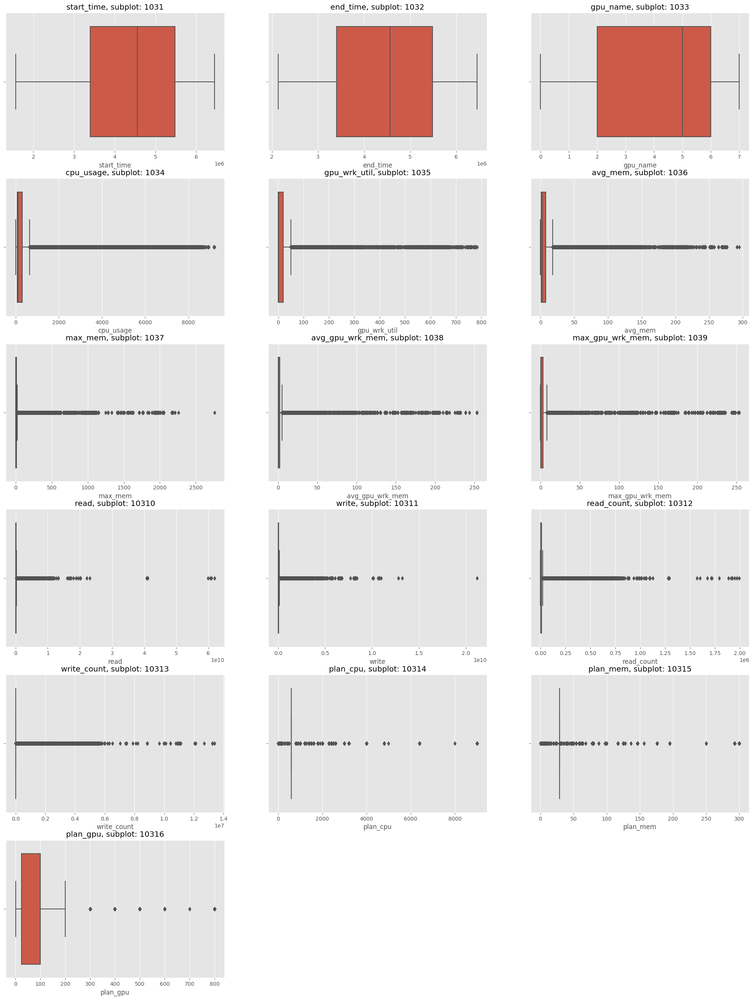

In [158]:
a=10
b=3
c=1
fig = plt.figure(figsize=(25,55))
for i in numerical_var:
    plt.subplot(a, b, c)
    plt.title('{}, subplot: {}{}{}'.format(i, a, b, c))
    plt.xlabel(i)
    sns.boxplot(x = tigs_jobs[i])
    c = c + 1

From the above box plot we can see that we don't have outlier in the start time, end time and gpu name. and beside these columns all of the columns have outliers. so lets remove them through IQR method

In [159]:
def remove_outlier(col_name):
  q1=tigs_jobs[col_name].quantile(0.25)
  q3=tigs_jobs[col_name].quantile(0.75)
  IQR=q3-q1
  return tigs_jobs[col_name][~((tigs_jobs[col_name]<(q1-1.5*IQR)) | (tigs_jobs[col_name]>(q3+1.5*IQR)))]


In [160]:
outlier_var = ['cpu_usage','gpu_wrk_util', 'avg_mem', 'max_mem', 'avg_gpu_wrk_mem', 'max_gpu_wrk_mem', 'read', 'write',
               'read_count', 'write_count', 'plan_cpu', 'plan_mem', 'plan_gpu']
for i in outlier_var:
  tigs_jobs[i] = remove_outlier(i)

## **Feature Engineering**

In [161]:
tigs_jobs['execution_time'] = tigs_jobs['end_time']- tigs_jobs['start_time']

In [162]:
from datetime import datetime

In [163]:
tigs_jobs['start_date'] =tigs_jobs['start_time'].apply(lambda x: datetime.fromtimestamp(x))
tigs_jobs['end_date'] =tigs_jobs['end_time'].apply(lambda x: datetime.fromtimestamp(x))

## **Visualization**

In [164]:
import warnings
warnings.filterwarnings('ignore')

### **Uni-Variate Analysis**

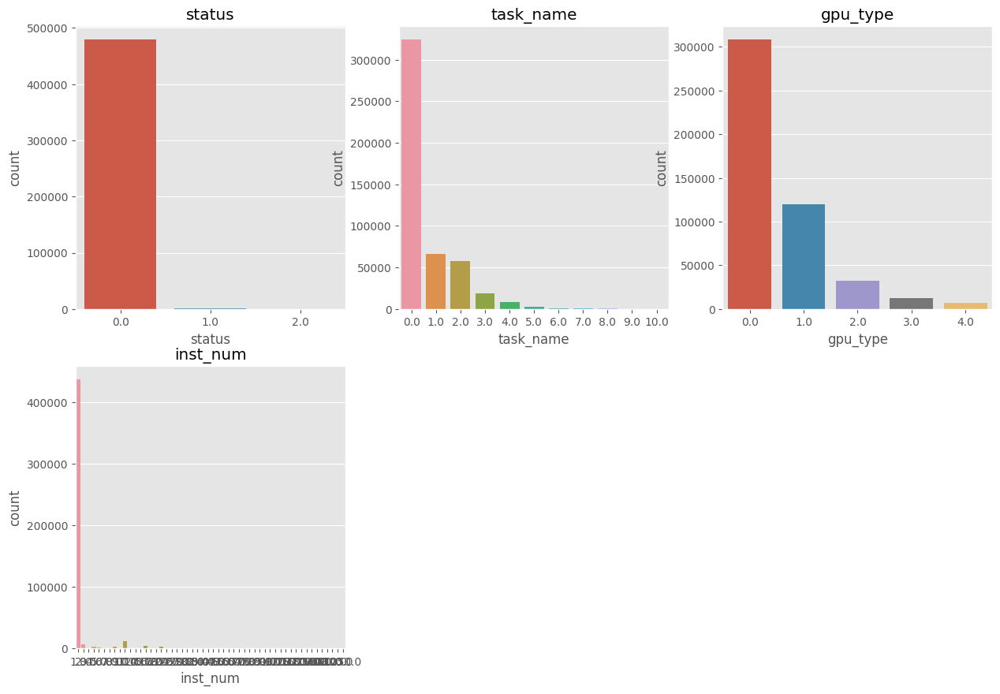

In [165]:
a=10
b=3
c=1
fig = plt.figure(figsize=(15,55))
for i in categorical:
    plt.subplot(a, b, c)
    plt.title('{}'.format(i))
    plt.xlabel(i)
    sns.countplot(data = tigs_jobs, x=i)
    c = c + 1

From the above plots we can see that:
- the status usually have 0 value that is the terminated
- In task_name column 0 values have occured most
- in gpu_type column the 0 value have occured most and 4 value occured least

**Distribution Plots**

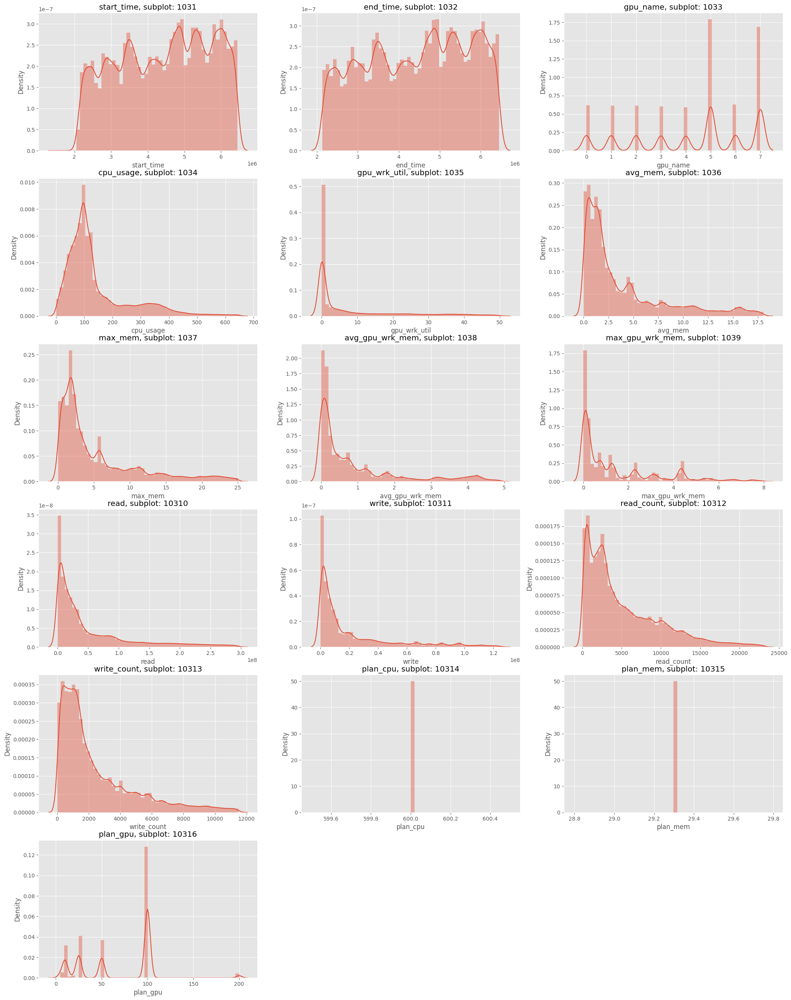

In [172]:
a=10
b=3
c=1
fig = plt.figure(figsize=(25,55))
for i in numerical_var:
    plt.subplot(a, b, c)
    plt.title('{}, subplot: {}{}{}'.format(i, a, b, c))
    plt.xlabel(i)
    sns.distplot(tigs_jobs[i])
    c = c + 1

From the above plot we can observe how the values are distributed, here we can see that:
- start_time and end_ time have normal distribution
- write, write_count, read, read_count, max_mem, avg_gpu_wrk_mem, max_gpu_wrk_mem, cpu_usage, gpu_wrk_util and avg_mem have postively skewed distribution and this mean that the median value is higher then the mean values.

### Bi-Variate Analysis

**Categorical variable with execution time**

these plots shows the relationship

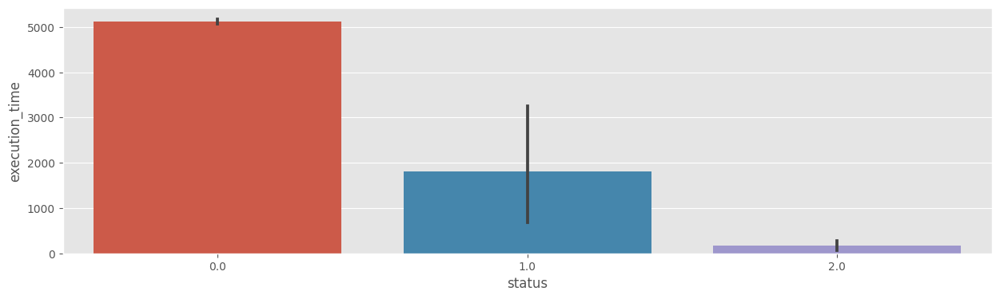

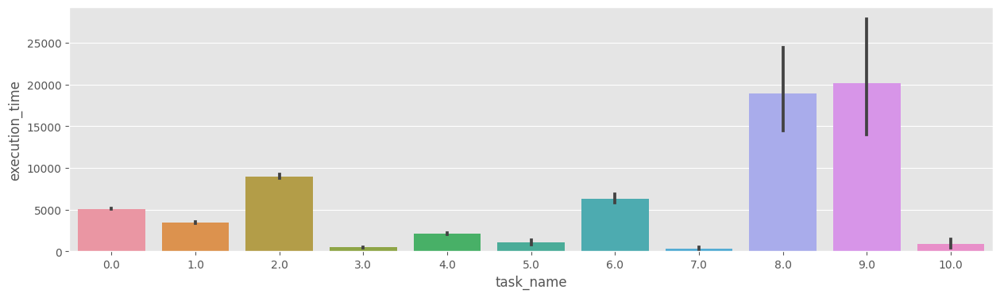

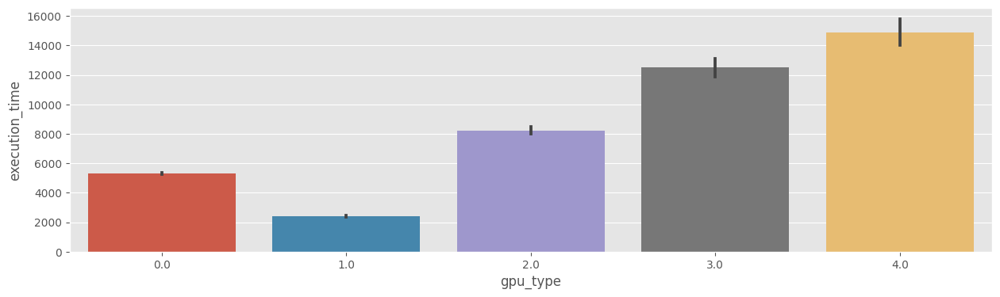

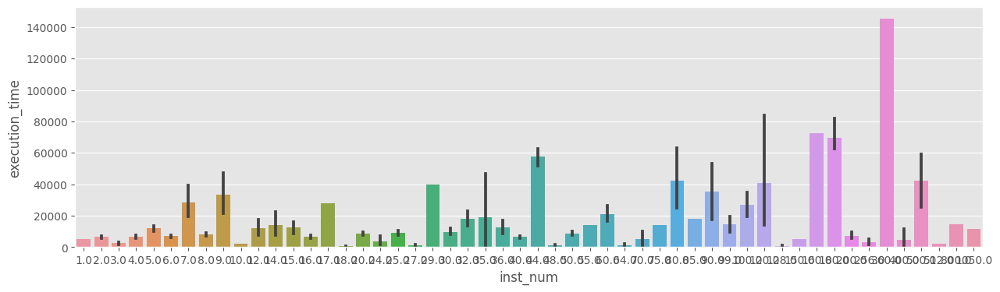

In [173]:
for i in categorical:
    fig , ax=plt.subplots(figsize=(15,4))
    sns.barplot(data = tigs_jobs, x = i ,y = 'execution_time')
#     sns.scatterplot(data = df, x = i ,y = 'price')
    ax.set_ylabel('execution_time')
    ax.set_xlabel(i)

Here we can see that:
- the gpu_type 4 have the highest execution time and 1 value have the lowest execution time.
- task name 8 and 9 have the highest execution time
- status zero have the highest execution time


**Numerical Variables with Execution time**

These plots shows the relationship

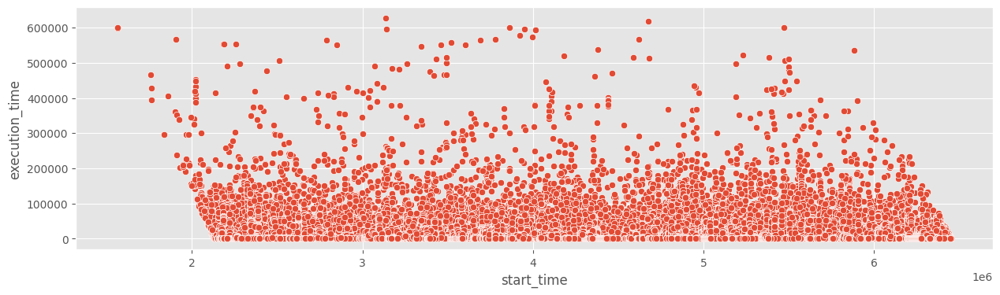

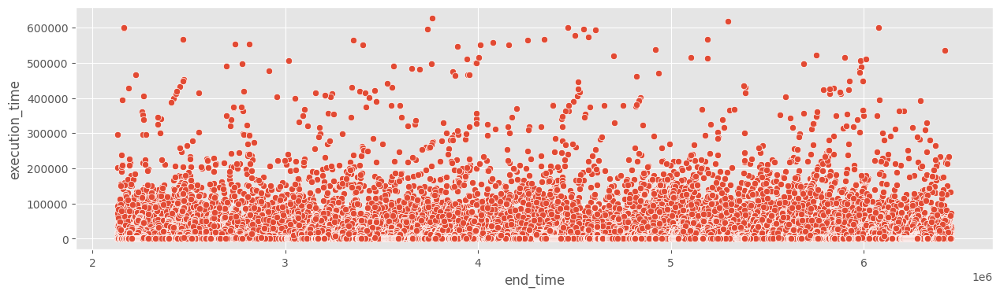

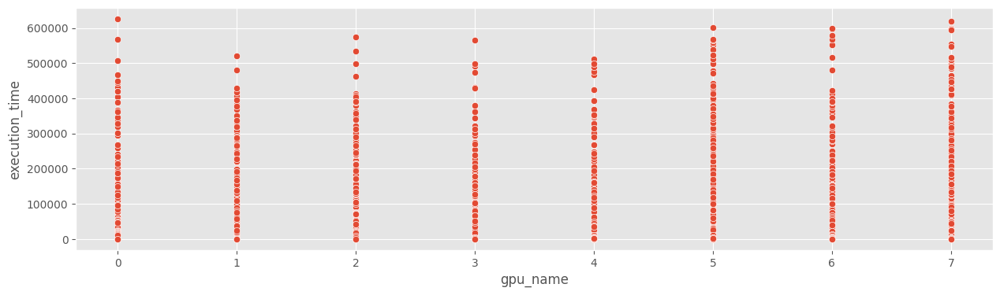

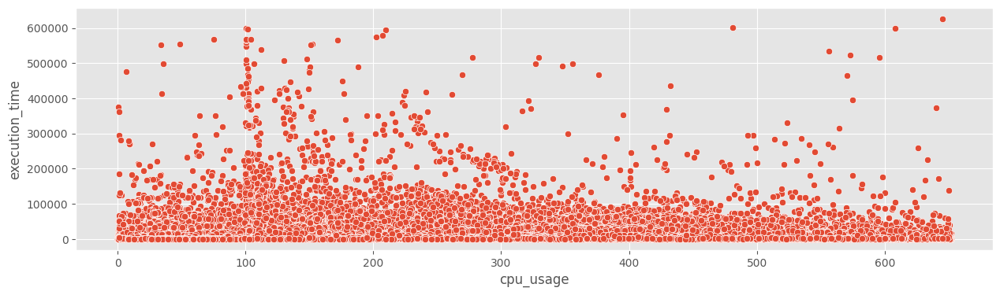

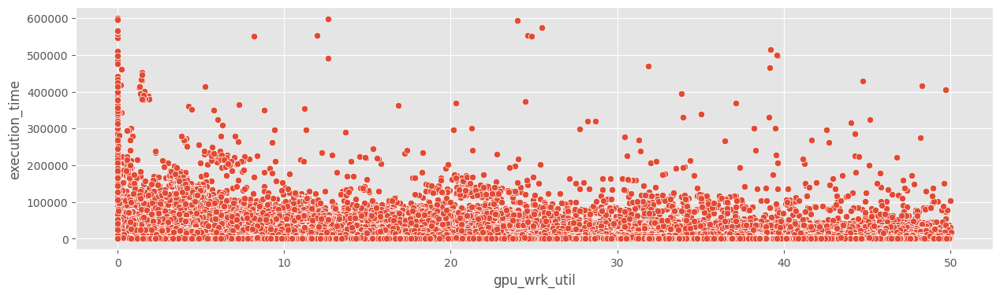

...

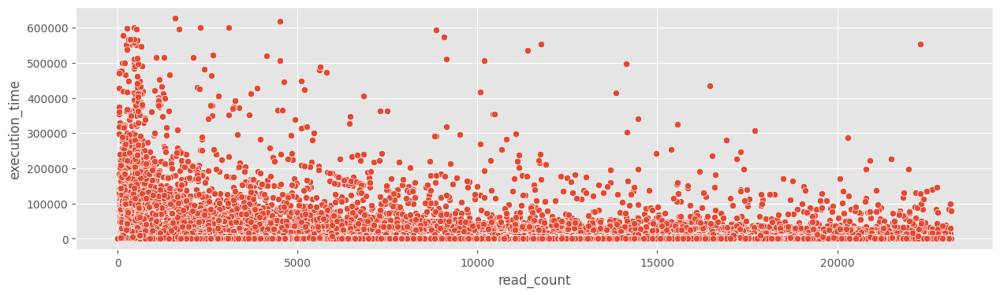

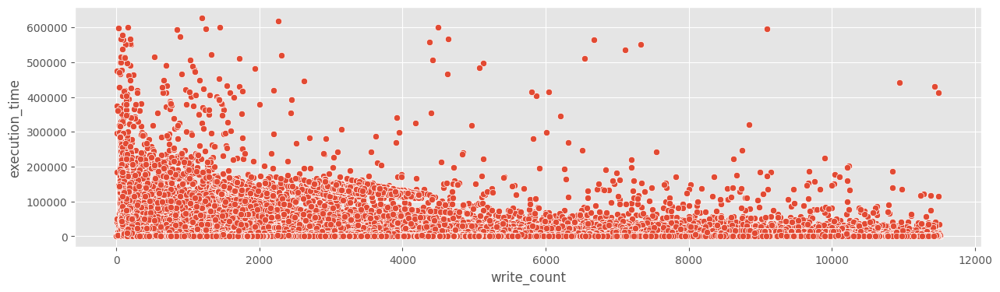

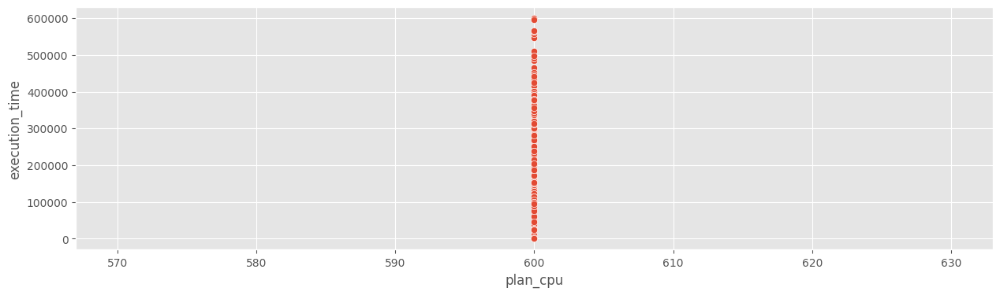

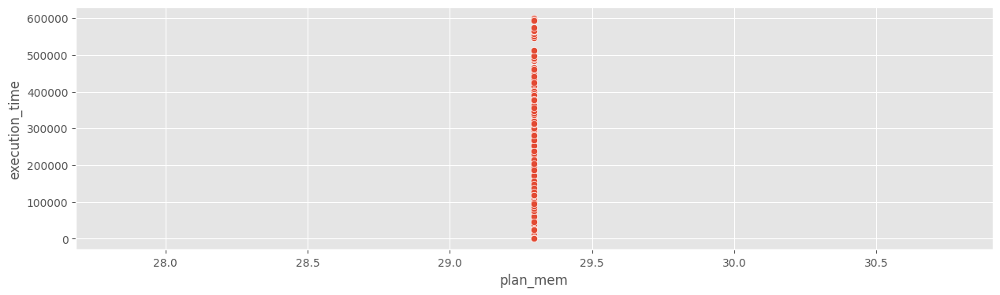

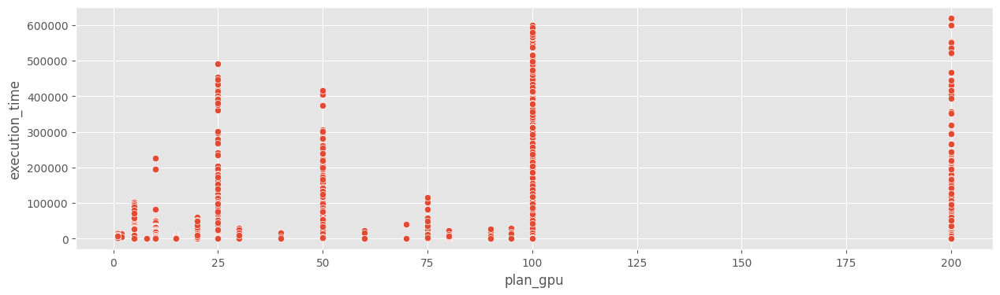

In [176]:
for i in numerical_var:
    fig , ax=plt.subplots(figsize=(15,4))
    # sns.barplot(data = tigs_jobs, x = i ,y = 'execution_time')
    sns.scatterplot(data = tigs_jobs, x = i ,y = 'execution_time')
    ax.set_ylabel('execution_time')
    ax.set_xlabel(i)

From the above plot we can see that:
- the execution time is high when the plan gpu is high
- as the value of write_count, read_count, write, read doesnot have very strong relationship with execution time but we can see that the as their increases the execution time slightly decreases

**Numerical Variables with CPU Usage**

These plots shows the relationship

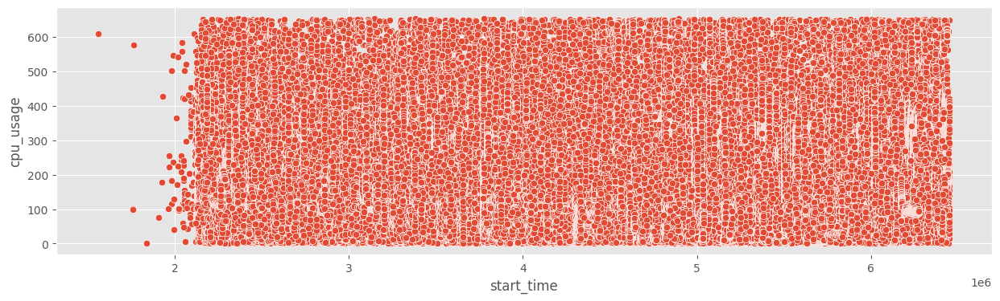

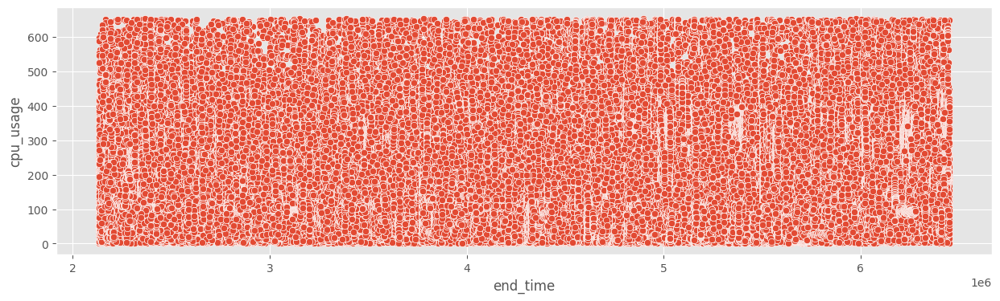

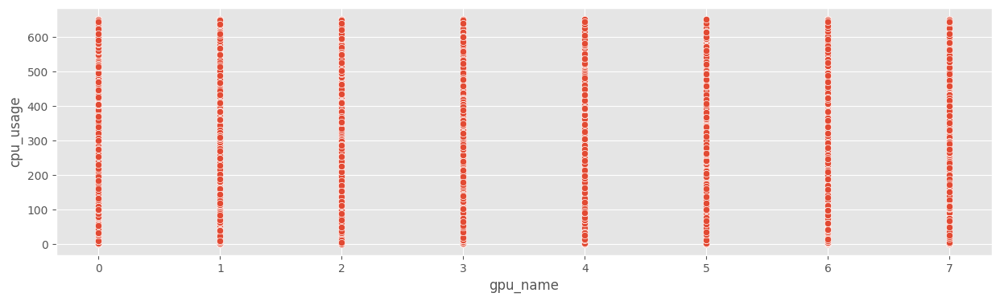

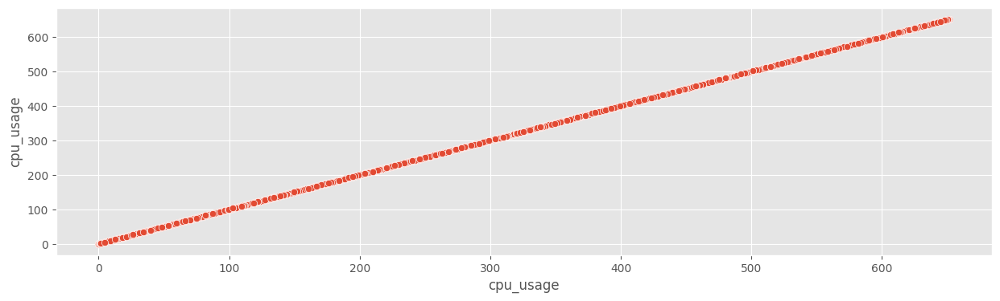

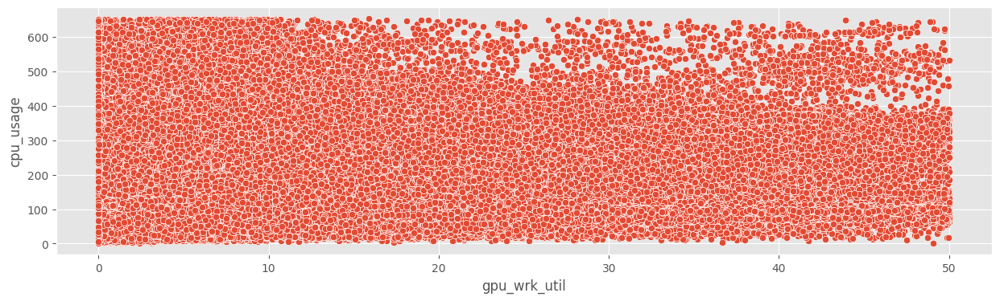

...

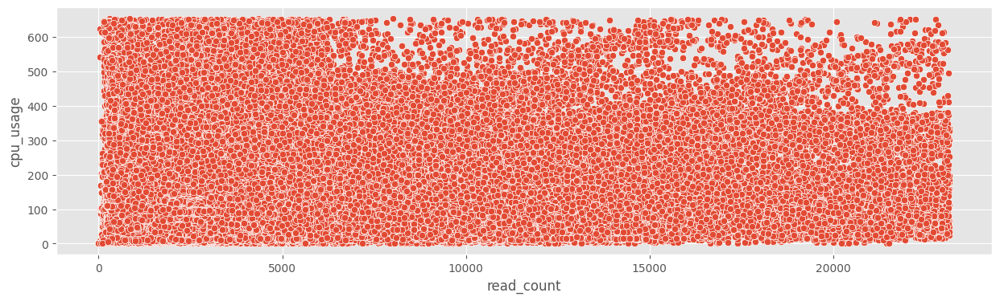

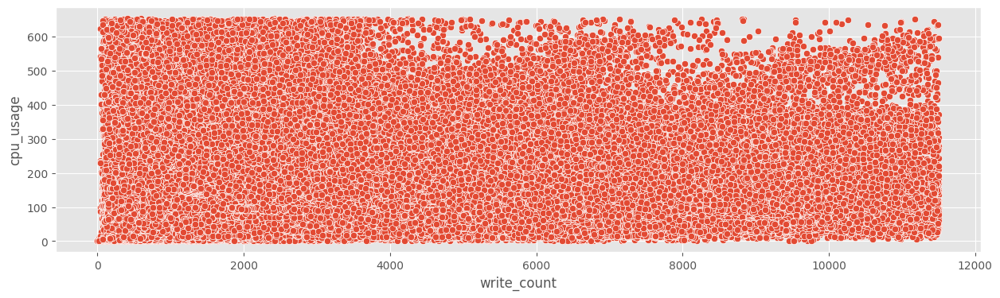

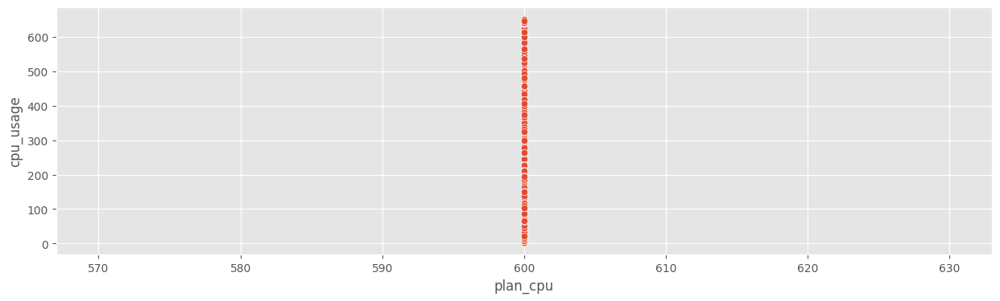

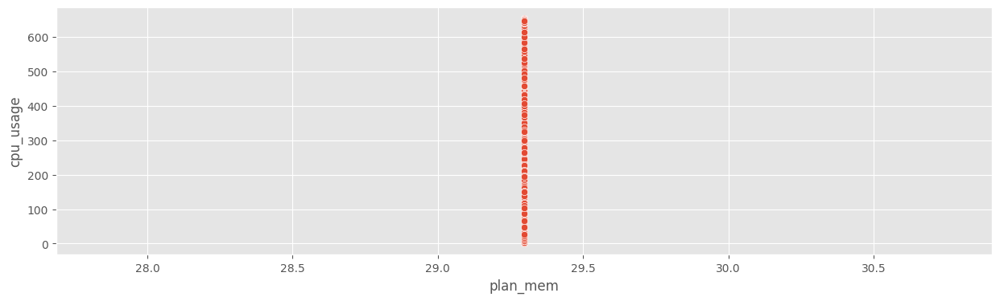

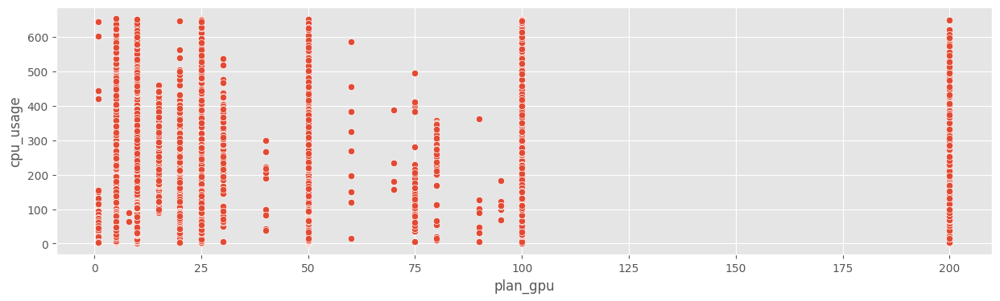

In [177]:
for i in numerical_var:
    fig , ax=plt.subplots(figsize=(15,4))
    # sns.barplot(data = tigs_jobs, x = i ,y = 'execution_time')
    sns.scatterplot(data = tigs_jobs, x = i ,y = 'cpu_usage')
    ax.set_ylabel('cpu_usage')
    ax.set_xlabel(i)

**Numerical Variables with GPU usage**

These plots shows the relationship

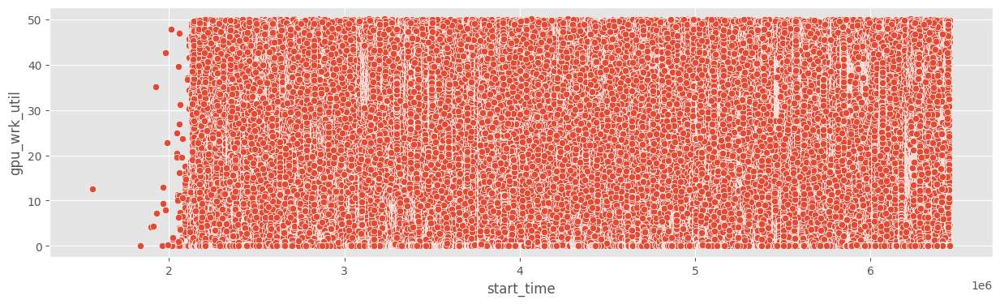

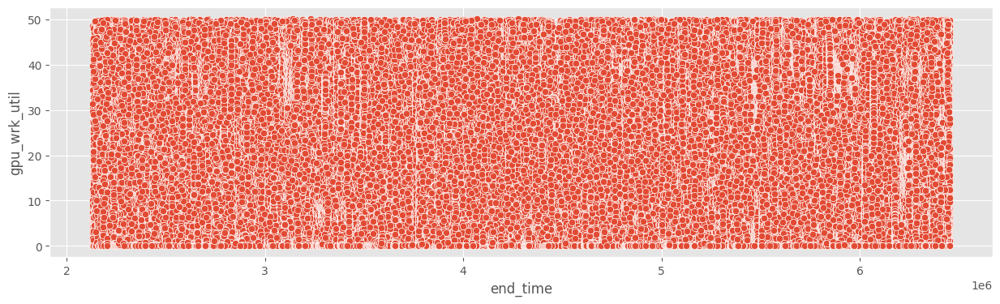

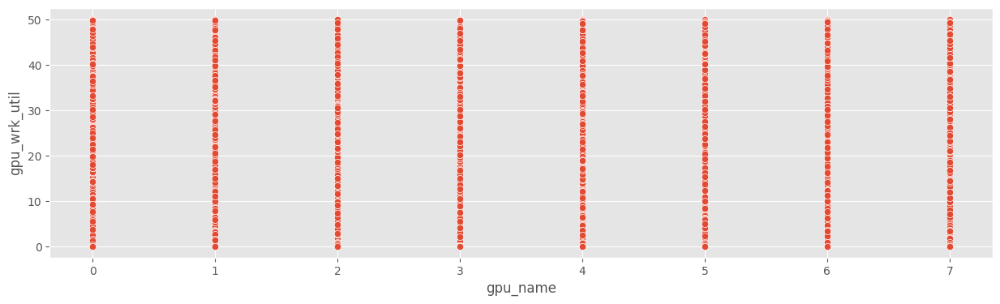

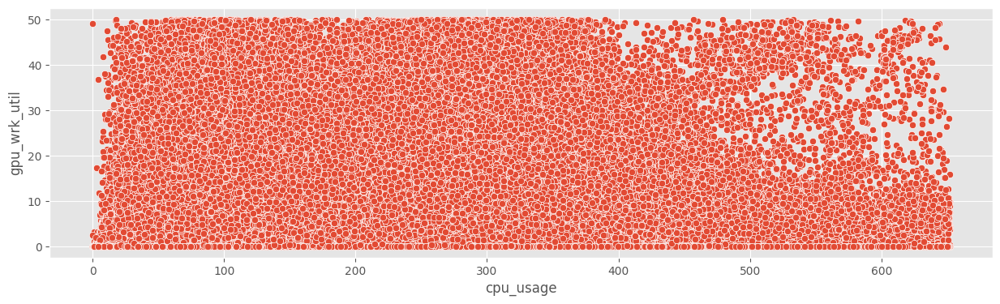

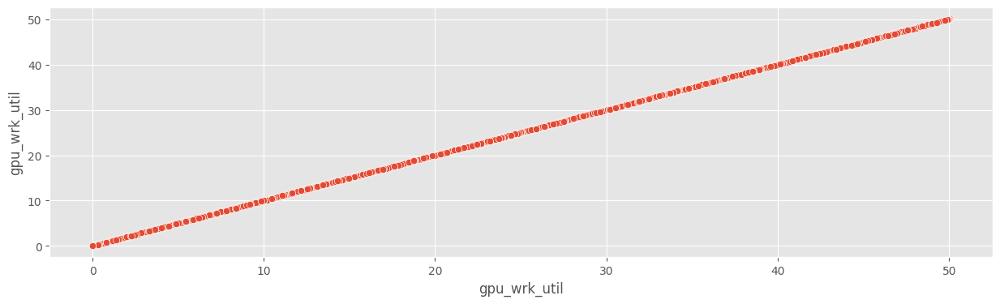

...

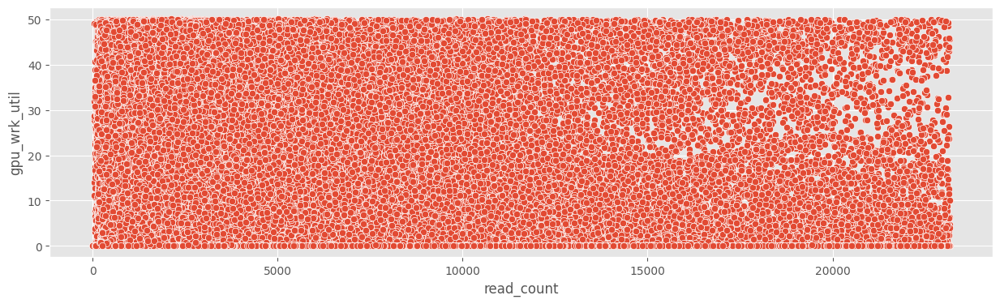

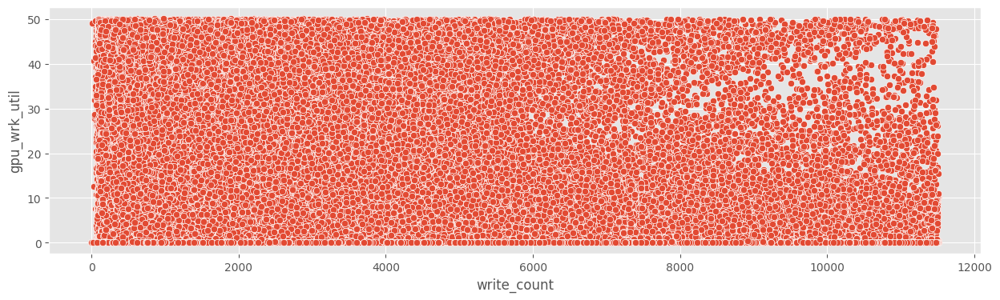

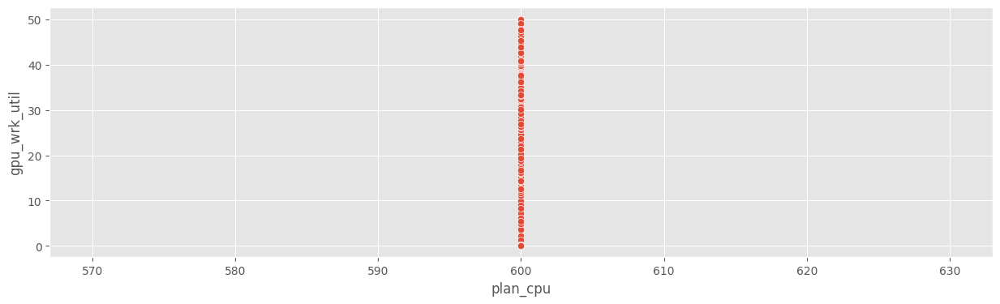

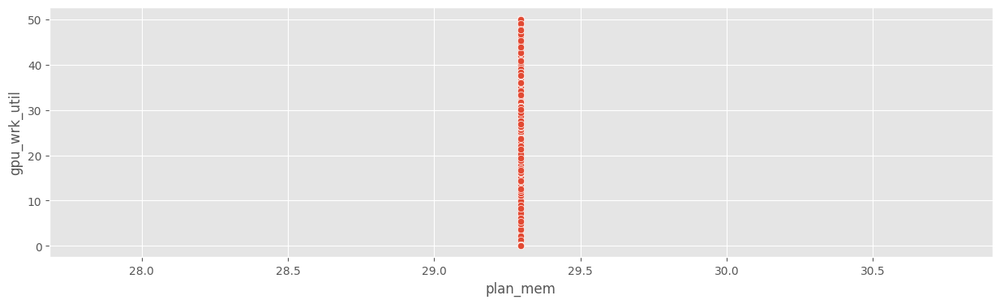

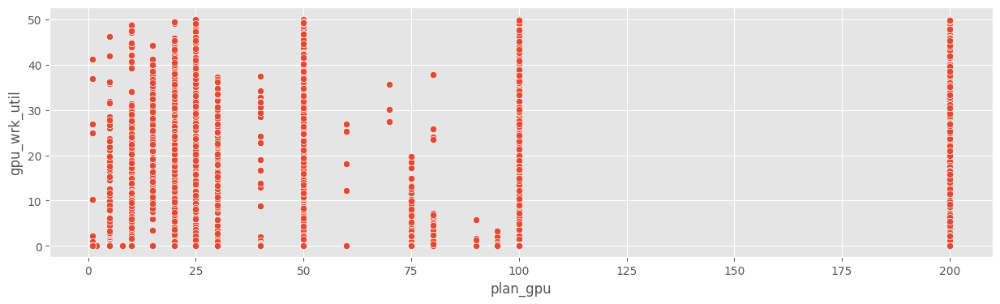

In [178]:
for i in numerical_var:
    fig , ax=plt.subplots(figsize=(15,4))
    # sns.barplot(data = tigs_jobs, x = i ,y = 'execution_time')
    sns.scatterplot(data = tigs_jobs, x = i ,y = 'gpu_wrk_util')
    ax.set_ylabel('gpu_wrk_util')
    ax.set_xlabel(i)

### Correlation

In [181]:
cor_df = tigs_jobs[['start_time', 'end_time', 'job_name', 'inst_id', 'status', 'user',
       'group', 'task_name', 'worker_name', 'machine', 'gpu_name', 'cpu_usage',
       'gpu_wrk_util', 'avg_mem', 'max_mem', 'avg_gpu_wrk_mem',
       'max_gpu_wrk_mem', 'read', 'write', 'read_count', 'write_count',
       'inst_num', 'plan_gpu', 'gpu_type',
       'execution_time', 'start_date', 'end_date']]

<Axes: >

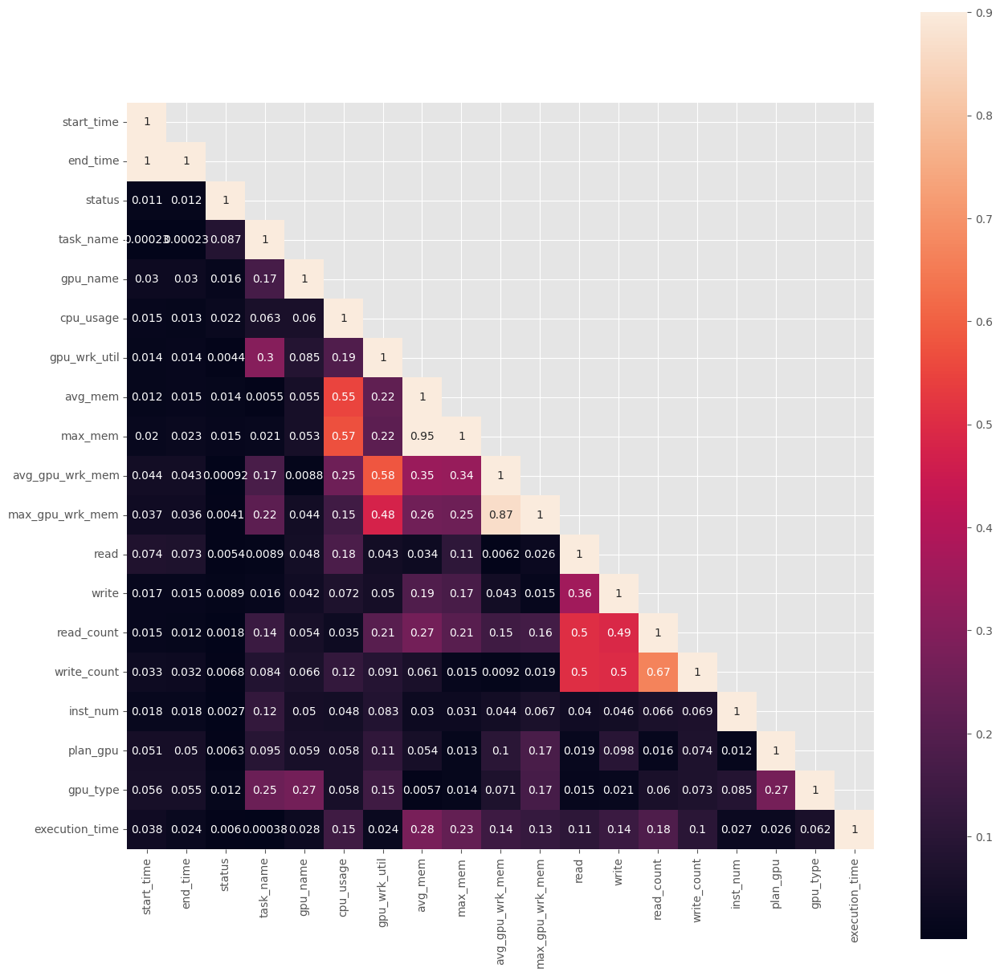

In [182]:
corr = cor_df.corr(method = 'pearson').abs()

#convert correlation to numpy array
mask = np.array(corr)

#to mask the repetitive value for each pair
mask[np.tril_indices_from(mask)] = False
fig, ax = plt.subplots(figsize = (15,12))
fig.set_size_inches(15,15)
sns.heatmap(corr, mask = mask, vmax = 0.9, square = True, annot = True)

### Multi-Variate Analysis

#### Overview of MLaaS workloads

In [184]:
def plot_data_cdf(data, inverse=False, datalabel=None, xlabel=None, title=None, xlog=False, xlim=None, ylog=False, xticks=None, figsize=(4,3), dpi=120, savefig=None, ylabel=None):
    plt.figure(figsize=figsize, dpi=dpi)
    if type(data) == pd.DataFrame:
        data.dropna(inplace=True)
    x, y = get_cdf(data, inverse)
    plt.plot(x, y, label=datalabel, color='green', linestyle='-')
    if datalabel is not None: plt.legend(loc='lower right')
    if xlog: plt.xscale('log')
    if ylog: plt.yscale('log')
    if xlim is not None: plt.xlim(xlim)
    plt.ylim(0, 100)
    if xlabel is not None: plt.xlabel(xlabel)
    plt.ylabel(ylabel) if ylabel is not None else plt.ylabel('CCDF') if inverse is True else plt.ylabel('CDF')
    if title is not None: plt.title(title)
    if xticks is not None: plt.xticks(xticks)
    plt.grid(alpha=.3, linestyle='--')
    if savefig is not None:
        plt.savefig('/tmp/figures/{}.pdf'.format(savefig),bbox_inches='tight')
    else:
        plt.show()

def get_cdf(data, inverse=False):
    sorted_data = sorted(data)
    p = 100. * np.arange(len(sorted_data))/(len(sorted_data)-1)
    p = 100. - p if inverse else p # CCDF
    return sorted_data, p

 cumulative distribution function of number of task submitted per user


<Figure size 480x360 with 0 Axes>

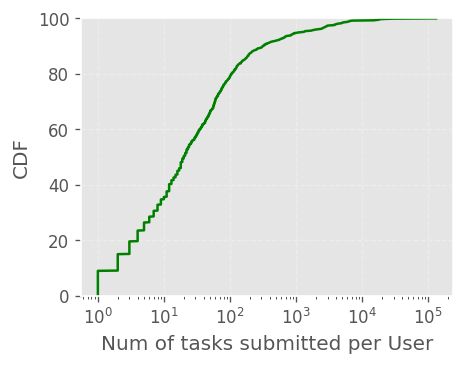

In [189]:
user_task_count = tigs_jobs.groupby('user').count()[['job_name']]

plt.figure(figsize=(4,3), dpi=120)
print(" cumulative distribution function of number of task submitted per user")
plot_data_cdf(user_task_count['job_name'], xlog=True,
              ylabel='CDF',xlabel='Num of tasks submitted per User',
              xticks=[1,10,100,10**3,10**4,10**5])


#### Number of Instences in Task

In [192]:
def get_inst_task_num_ratio(tigs_jobs, inst_num_list=[2, 8, 20, 64, 100, 256, 512]):
    total_num_task, total_num_inst = len(tigs_jobs), sum(tigs_jobs['inst_num'])
    data_df = []
    for i in inst_num_list:
        temp_df = tigs_jobs[tigs_jobs['inst_num'] >= i]
        task_num_ratio = len(temp_df) / total_num_task
        inst_num_ratio = sum(temp_df['inst_num']) / total_num_inst
        data_df.append([task_num_ratio, inst_num_ratio])
    out_df = pd.DataFrame(data_df, columns=['num_task_ratio','num_inst_ratio'])
    out_df = out_df.T.rename(columns=dict(zip(range(len(inst_num_list)), inst_num_list)))
    return out_df

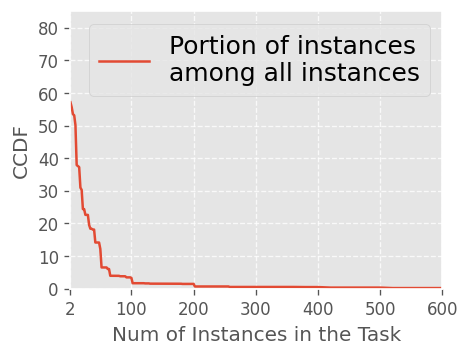

In [193]:
inst_num_list = list(range(2, 300, 2))+list(range(300, 620, 20))
inst_task_num_ratio_df = get_inst_task_num_ratio(tigs_jobs, inst_num_list) * 100

plt.figure(figsize=(4,3), dpi=120)
plt.plot(inst_task_num_ratio_df.T.num_inst_ratio, label='Portion of instances\namong all instances')
plt.grid(alpha=0.8, linestyle='--')
plt.xlabel('Num of Instances in the Task')
plt.ylabel('CCDF')
plt.xticks((2,100,200,300,400,500,600))
plt.yticks([0,10,20,30,40,50,60,70,80])
plt.xlim(2, 600)
plt.ylim(0, 85)
plt.legend(fontsize=15)

#### Task submission patterns

**Number of Tasks - Hours from the begining of a week (Sun to Sat)**

Hour 0 Date: 1970-01-25 00:05:13


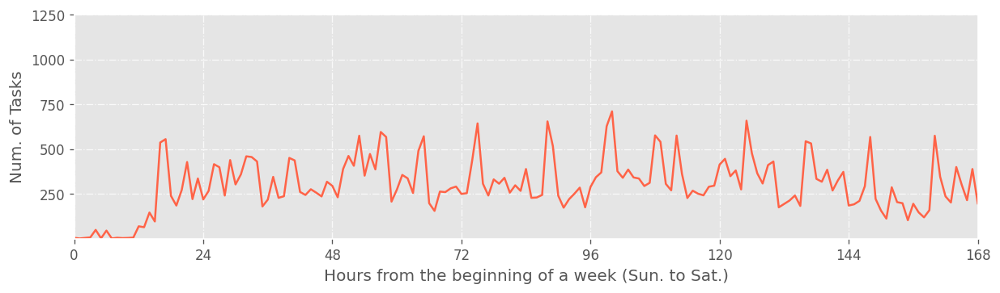

In [194]:
offset = -600
tigs_jobs['hourofyear'] = tigs_jobs.start_date.apply(lambda c: c.dayofyear * 24 + c.hour)
dftcc = tigs_jobs.groupby('hourofyear').count()[['job_name']].reset_index()
dftcc['hour'] = dftcc.hourofyear + offset
print('Hour 0 Date: {}'.format(tigs_jobs[tigs_jobs.hourofyear==-offset].start_date.min()))

plt.figure(figsize=(12,3), dpi=120)
num_days = 7
plt.plot(dftcc[(dftcc.hour>=0)&(dftcc.hour<24*num_days+1)].set_index('hour')[['job_name']], color='tomato')
plt.xlabel('Hours from the beginning of a week (Sun. to Sat.)')
plt.ylabel('Num. of Tasks')
plt.grid(alpha=0.8, linestyle='-.')
plt.xlim(0, 24*num_days)
plt.ylim(0, )
plt.yticks([250,500,750,1000,1250])
_ = plt.xticks([24 * x for x in range(num_days+1)])
# plt.savefig('/tmp/figures/{}.pdf'.format('diurnal-pattern-task'),bbox_inches='tight')

**Tasks submited - Hour of the day (12 am- 11pm)**

In [195]:
def get_hourly_task_request(df): # df = dftjkix
    sum_df_list = []
    df = add_hour_date(df.copy())
    # for day in sorted(df.dayofyear.unique()):
    for date in sorted(df.date.unique()):
        # tempdf = df[df.dayofyear==day]
        tempdf = df[df.date==date]
        res_df = tempdf.groupby('hour').count()[['job_name']]
        res_df.rename(columns={'job_name':date}, inplace=True)
        sum_df_list.append(res_df.T)
    out_df = pd.DataFrame().append(sum_df_list)
    return out_df.dropna() # if a day contains hours of NaN, it is not a typical day

def add_hour_date(df):
    if 'start_date' not in df:
        if 'start_time_t' in df:
            target_col = 'start_time_t'
        elif 'start_time' in df:
            target_col = 'start_time'
        else:
            print('start_time, start_time_t, dayofyear unfound in df')
            return None
        df['start_date'] = df[target_col].apply(lambda x: pd.Timestamp(x, unit='s', tz='Asia/Shanghai'))
    if 'date' not in df:
        df['date'] = df['start_date'].apply(lambda x: x.date())
    if 'hour' not in df:
        df['hour'] = df['start_date'].apply(lambda x: x.hour)
    return df

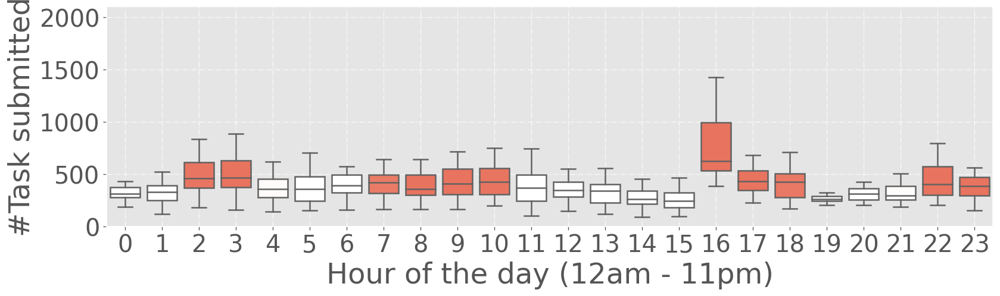

In [196]:
hourly_task = get_hourly_task_request(tigs_jobs)
hourly_task_data_df = pd.melt(hourly_task,
    value_vars=[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23])
hourly_task_data_df['hour'] = hourly_task_data_df['hour'].astype('int')

matplotlib.rcParams.update({"font.size": 24})
plt.figure(figsize=(16,4), dpi=120)
highlight_color = 'tomato'
mean_value = hourly_task_data_df.value.mean()
color_df = pd.DataFrame(hourly_task_data_df.groupby('hour').mean())
color_df['color'] = color_df.value.apply(lambda x: '1' if x < mean_value else highlight_color)
color_df['mean_value'] = mean_value
color_palette = sns.blend_palette(color_df.color.tolist(), n_colors=24)

g = sns.boxplot(data=hourly_task_data_df, x='hour', y='value', whis=1, fliersize=0, palette=color_palette)
g.set(ylim=(0, 2100))
g.set(xlabel='Hour of the day (12am - 11pm)')
g.set(ylabel='#Task submitted')
plt.yticks([0,500,1000,1500,2000])
plt.grid(alpha=0.8, linestyle='-.')
matplotlib.rcParams.update({"font.size": 16})
# plt.savefig('/tmp/figures/{}.pdf'.format('overview-task_submission_hourly'),bbox_inches='tight')

**Total Resource Requirments - Hours from the begining of a week (Sun to Sat)**

Hour 0 Date: 1970-01-25 00:05:13


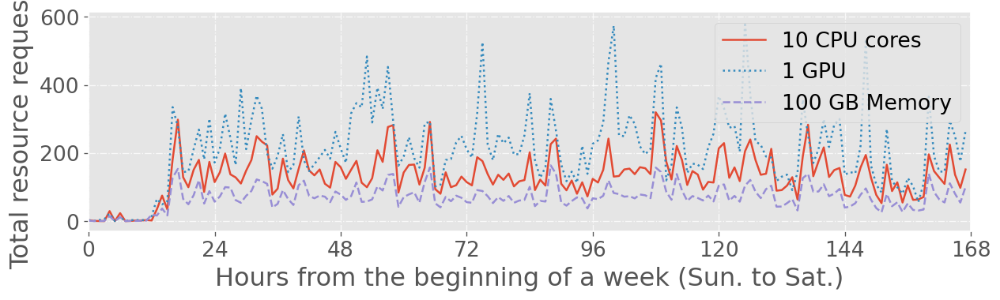

In [197]:
tigs_jobs['hourofyear'] = tigs_jobs.start_date.apply(lambda c: c.dayofyear * 24 + c.hour)
dfitcr = tigs_jobs.groupby('hourofyear').sum()[['plan_cpu','plan_gpu','plan_mem']].reset_index()
dfitcr['hour'] = dfitcr.hourofyear + offset
print('Hour 0 Date: {}'.format(tigs_jobs[tigs_jobs.hourofyear==-offset].start_date.min()))

plt.figure(figsize=(12,3), dpi=120)
num_days = 7
plt.plot(dfitcr[(dfitcr.hour>=0)&(dfitcr.hour<24*num_days)].set_index('hour')['plan_cpu']/1000, label='10 CPU cores', linestyle='solid')
plt.plot(dfitcr[(dfitcr.hour>=0)&(dfitcr.hour<24*num_days)].set_index('hour')['plan_gpu']/100, label='1 GPU', linestyle='dotted')
plt.plot(dfitcr[(dfitcr.hour>=0)&(dfitcr.hour<24*num_days)].set_index('hour')['plan_mem']/100, label='100 GB Memory', linestyle='dashed')
plt.xlabel('Hours from the beginning of a week (Sun. to Sat.)')
plt.ylabel('Total resource requests')
plt.grid(alpha=0.8, linestyle='-.')
plt.legend(ncol=1, loc='best')
plt.xlim(0, 24*num_days)
_ = plt.xticks([24 * x for x in range(num_days+1)])

**CPUs Requested - Hour of the day (12am - 11pm)**

In [198]:
def get_hourly_task_resource_request(df, metrics='cpu'): # df = dftjkix
    sum_df_list = []
    df = add_hour_date(df)
    if metrics == 'cpu':
        df['plan_resource'] = df.plan_cpu.apply(lambda x: x/100)
    elif metrics == 'gpu':
        df['plan_resource'] = df.plan_gpu.apply(lambda x: x/100)
    elif metrics == 'mem':
        df['plan_resource'] = df.plan_mem.apply(lambda x: x/1000)
    else:
        exit()
    # for day in sorted(df.dayofyear.unique()):
    for date in sorted(df.date.unique()):
        # tempdf = df[df.dayofyear==day]
        tempdf = df[df.date==date]
        res_df = tempdf.groupby('hour').sum()[['plan_resource']]
        res_df.rename(columns={'job_name':date}, inplace=True)
        sum_df_list.append(res_df.T)
    out_df = pd.DataFrame().append(sum_df_list)
    return out_df.dropna() # if a day contains hours of NaN, it is not a typical day

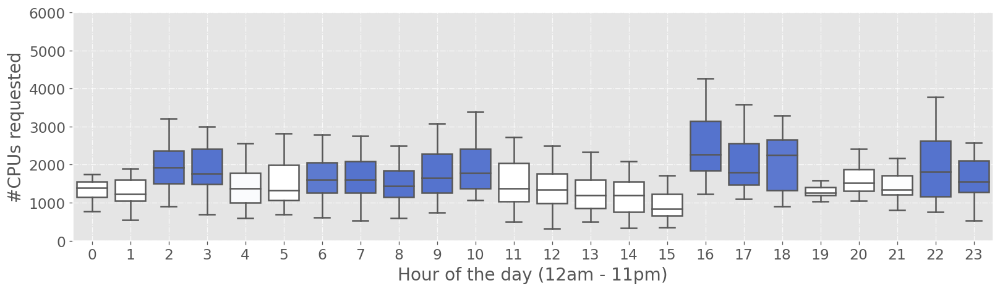

In [201]:
plan_cpu_df = get_hourly_task_resource_request(tigs_jobs.dropna(subset=['job_name']), metrics='cpu')
plan_cpu_data_df = pd.melt(plan_cpu_df,
    value_vars=[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23])
plan_cpu_data_df['hour'] = plan_cpu_data_df['hour'].astype('int')

matplotlib.rcParams.update({"font.size": 14})
plt.figure(figsize=(16,4), dpi=120)
highlight_color = 'royalblue'
mean_value = plan_cpu_data_df.value.mean()
color_df = pd.DataFrame(plan_cpu_data_df.groupby('hour').mean())
color_df['color'] = color_df.value.apply(lambda x: '1' if x < mean_value else highlight_color)
color_palette = sns.blend_palette(color_df.color.tolist(), n_colors=24)

g = sns.boxplot(data=plan_cpu_data_df, x='hour', y='value', whis=1, fliersize=0, palette=color_palette)
g.set(ylim=(0, 6000))
g.set(xlabel='Hour of the day (12am - 11pm)')
g.set(ylabel='#CPUs requested')
plt.grid(alpha=0.8, linestyle='-.')
matplotlib.rcParams.update({"font.size": 13})

#### Task Runtime and Wait Time

In [202]:
linestyle_list = [
     ('solid', 'solid'),       # Same as (0, ()) or '-'
     ('dotted', 'dotted'),     # Same as (0, (1, 1)) or '.'
     ('dashed', 'dashed'),     # Same as '--'
     ('dashdot', 'dashdot'),   # Same as '-.'
     ('densely dashdotdotted', (0, (3, 1, 1, 1, 1, 1))),
     ('densely dashdotted',    (0, (3, 1, 1, 1))),
     ('densely dotted',        (0, (1, 1))),
     ('densely dashed',        (0, (5, 1))),
     ('dashdotdotted',         (0, (3, 5, 1, 5, 1, 5))),
     ('loosely dashed',        (0, (5, 10))),
     ('loosely dashdotted',    (0, (3, 10, 1, 10))),
     ('loosely dashdotdotted', (0, (3, 10, 1, 10, 1, 10))),
     ('loosely dotted',        (0, (1, 10))),
     ('dashed',                (0, (5, 5))),
     ('dashdotted',            (0, (3, 5, 1, 5))),
     ('dotted',                (0, (1, 1))),
]

In [203]:
def plot_data_cdfs(data, datalabel=None, inverse=False, xlabel=None, title=None, xlog=False, ylog=False, xticks=None, figsize=(4,3), dpi=120, xlim=None, ylim=None, ylabel=None, yticks=None, savefig=None, loc='best', fontsize=None):
    plt.figure(figsize=figsize, dpi=dpi)
    for i, d in enumerate(data):
        if type(data) == pd.DataFrame:
            d.dropna(inplace=True)
        x, y = get_cdf(d, inverse)
        label = datalabel[i] if datalabel is not None else None
        plt.plot(x, y, label=label, linestyle=linestyle_list[i % len(linestyle_list)][1])
    if datalabel is not None: plt.legend(loc=loc, fontsize=fontsize)
    if xlog: plt.xscale('log')
    if ylog: plt.yscale('log')
    plt.ylim(0, 100) if ylim is None else plt.ylim(ylim)
    if xlim is not None: plt.xlim(xlim)
    if xlabel is not None: plt.xlabel(xlabel)
    if ylabel is None:
        plt.ylabel('CCDF') if inverse is True else plt.ylabel('CDF')
    else:
        plt.ylabel(ylabel)
    if title is not None: plt.title(title)
    if xticks is not None: plt.xticks(xticks)
    if yticks is not None: plt.yticks(yticks)
    plt.grid(alpha=.3, linestyle='--')
    if savefig is not None:
        plt.savefig('/tmp/figures/{}.pdf'.format(savefig),bbox_inches='tight')
    else:
        plt.show()


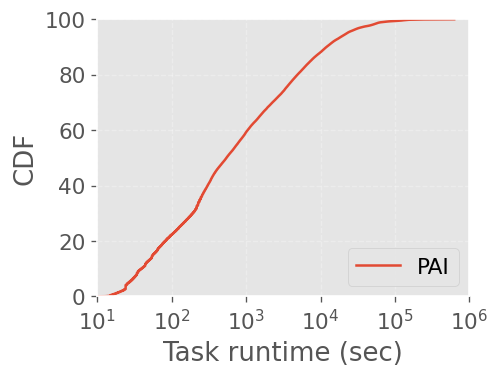

In [204]:
plot_data_cdfs([tigs_jobs.execution_time.dropna()], ['PAI'],
               xticks=[10,100,1000,10000,10**5,10**6], xlim=[10,10**6],
               xlog=True, xlabel='Task runtime (sec)', loc='lower right')

#### Wait_Time /Complation_Time (%)

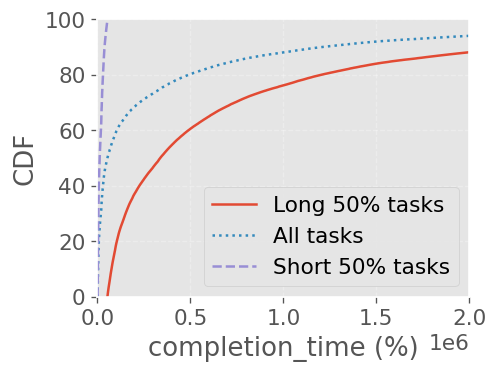

In [231]:
data_df = tigs_jobs
median_time = data_df.execution_time.median()
data_df['wait_over_completion'] = data_df['execution_time']
plot_data_cdfs([100*data_df[data_df.execution_time > median_time]['wait_over_completion'].dropna(),
                100*data_df['wait_over_completion'].dropna(),
                100*data_df[data_df.execution_time <= median_time]['wait_over_completion'].dropna()],
               ['Long 50% tasks','All tasks','Short 50% tasks'],
               xlabel='completion_time (%)', figsize=(4,3),xlim=(0, 2000000))

Since the range of short 50% tasks is shorter compare to the long 50% tasks and all tasks. so we will plot it seperately

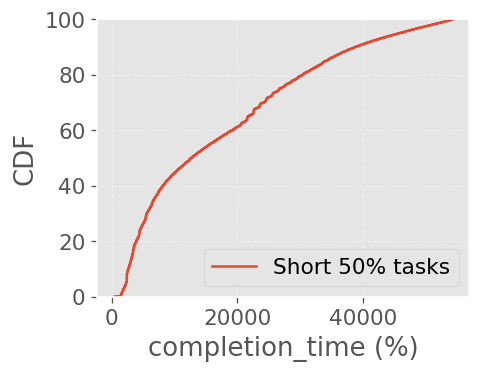

In [222]:
plot_data_cdfs([100*data_df[data_df.execution_time <= median_time]['wait_over_completion'].dropna()],
               ['Short 50% tasks'],
               xlabel='completion_time (%)', figsize=(4,3))

#### Task Wait Time and Runtime by GPU Requests

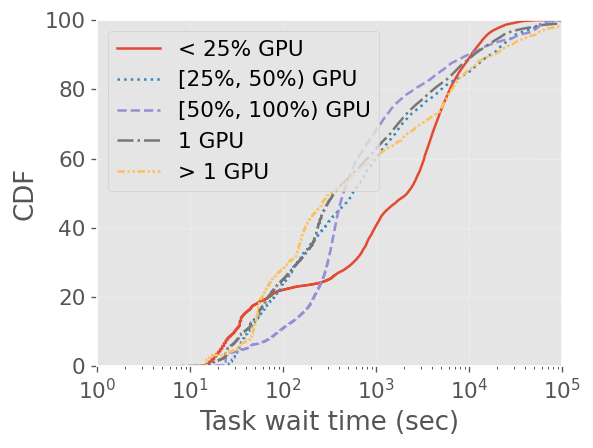

In [195]:
data_df = tigs_jobs
data = [data_df[data_df.plan_gpu < 25].execution_time.dropna(),
        data_df[(data_df.plan_gpu >= 25)&(data_df.plan_gpu < 50)].execution_time.dropna(),
        data_df[(data_df.plan_gpu >= 50)&(data_df.plan_gpu < 100)].execution_time.dropna(),
        data_df[(data_df.plan_gpu ==100)].execution_time.dropna(),
        data_df[(data_df.plan_gpu > 100)].execution_time.dropna()]
data_label = ['< 25% GPU', '[25%, 50%) GPU', '[50%, 100%) GPU', '1 GPU','> 1 GPU']
plot_data_cdfs(data, datalabel=data_label, figsize=(5,3.75), dpi=120,
               xlog=True, xticks=[1,10,100,1000,10**4,10**5], xlim=(1, 10**5), xlabel='Task wait time (sec)')

#### Task Wait Time and Runtime by GPU Type

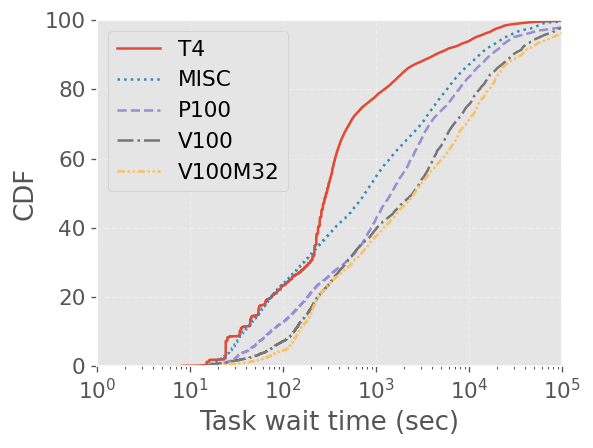

In [196]:
data_df = tigs_jobs
data = [data_df[data_df.gpu_type==1].execution_time.dropna(),
        data_df[data_df.gpu_type==0].execution_time.dropna(),
        data_df[data_df.gpu_type==2].execution_time.dropna(),
        data_df[data_df.gpu_type==3].execution_time.dropna(),
        data_df[data_df.gpu_type==4].execution_time.dropna(),]
data_label = ['T4', 'MISC', 'P100', 'V100', 'V100M32']
plot_data_cdfs(data, datalabel=data_label, figsize=(5,3.75), dpi=120,
               xlog=True, xticks=[1,10,100,1000,10**4,10**5], xlim=(1, 10**5), xlabel='Task wait time (sec)')

#### Task Resource Request and Usage

In [214]:
tigs_jobs[['plan_cpu', 'cpu_usage']].describe()

,plan_cpu,cpu_usage
count,338738.0,410621.000000
mean,600.0,143.203676
std,0.0,116.957881
min,600.0,0.000000
25%,600.0,70.666667
50%,600.0,102.881279
75%,600.0,167.387097
max,600.0,651.847337


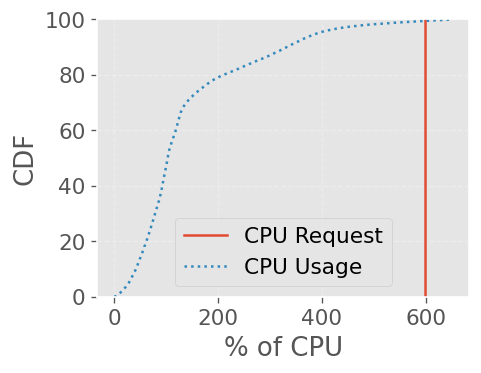

In [235]:
# CPUs
data_df = tigs_jobs
plot_data_cdfs([data_df['plan_cpu'].dropna(), data_df['cpu_usage'].dropna()], ['CPU Request', 'CPU Usage'],
              xlabel='% of CPU', ylabel='CDF', dpi=120)

From the above describe function we can see that the plan cpu have 600 values for all of the rows, so it is logical to see straigth vertical line in the plot

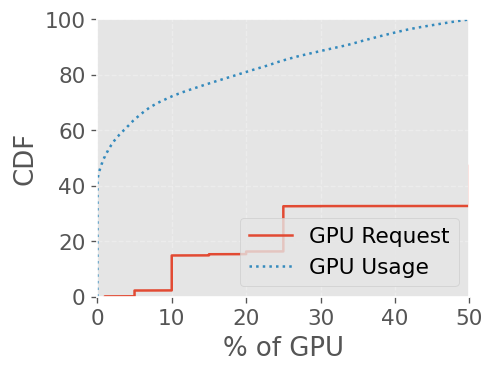

In [241]:
#GPUs

data_df = tigs_jobs
plot_data_cdfs([data_df['plan_gpu'].dropna(), data_df['gpu_wrk_util'].dropna()], ['GPU Request', 'GPU Usage'],
              xlabel='% of GPU', xlim=(0, 50), ylabel='CDF', dpi=120,loc='lower right')

In [245]:
tigs_jobs[['plan_mem', 'avg_gpu_wrk_mem']].describe()

,plan_mem,avg_gpu_wrk_mem
count,396150.000000,422943.000000
mean,29.296875,0.910875
std,0.000000,1.208451
min,29.296875,0.000000
25%,29.296875,0.132395
50%,29.296875,0.378255
75%,29.296875,1.207409
max,29.296875,4.889123


From this table we can see that there is constant value in plan_mem, so it will not be included in the cdf plot

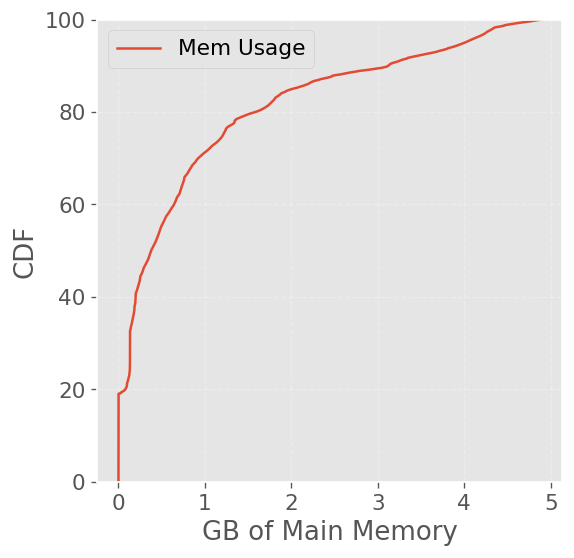

In [247]:
#Memory

data_df = tigs_jobs
plot_data_cdfs([ data_df['avg_gpu_wrk_mem'].dropna()], [ 'Mem Usage'],
              xlabel='GB of Main Memory', ylabel='CDF', dpi=120)#

#### Machine-Level CPU Usage (%)

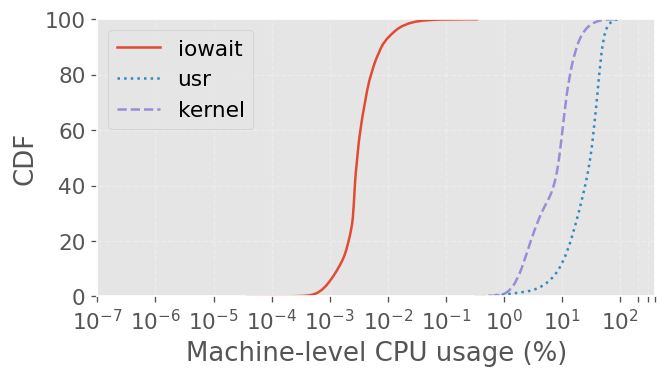

In [251]:
plot_data_cdfs([metric[x].dropna() for x in ['machine_cpu_iowait','machine_cpu_usr','machine_cpu_kernel']],
              ['iowait','usr','kernel'], xlog=True, figsize=(6,3),
              xticks=[10**-7,10**-6,10**-5,10**-4,10**-3, 10**-2, 10**-1, 1, 10, 100,200,300,400], xlim=[10**-7, 400],
              xlabel='Machine-level CPU usage (%)')

## **Calculating Episode**

In [223]:
split_time_sec = list(range((int(tigs_jobs['start_time'].min())), int(tigs_jobs['end_time'].max()),3))

In [224]:
len(split_time_sec)

1629304

In [226]:
episode_num = list(range(1,len(split_time_sec)+1))
len(episode_num)

1629304

In [230]:
episode_in_sec = pd.Series(split_time_sec)
episode_in_num = pd.Series(episode_num)

episode_df = pd.DataFrame(episode_in_sec,columns=['episode_in_sec'])
episode_df['episode_in_num']= episode_in_num

In [262]:
inst_id = episode_df['episode_in_sec'].apply(lambda x: tigs_jobs[(tigs_jobs['start_time']<=x) & (tigs_jobs['end_time']>=x)]['inst_id'].values[0])

In [268]:
episode_df['inst_id']= inst_id
df = pd.merge(episode_df,tigs_jobs,on=['inst_id'],how='left')

In [269]:
df.shape

(1629304, 33)

In [271]:
df.head()

,episode_in_sec,episode_in_num,inst_id,start_time,end_time,job_name,status,user,group,task_name,...,inst_num,plan_cpu,plan_mem,plan_gpu,gpu_type,execution_time,start_date,end_date,hourofyear,wait_over_completion
0,1563282,1,4c682727a0ac07d8ca30df4a859103d03dbc47ce7f245c...,1563282.0,2162727.0,ab81a8ed003c5af878460000,0.0,147201a54c50,b22d28079fc41001c93a7acc5a82fa43,1.0,...,16.0,600.0,29.296875,200.0,2.0,599445.0,1970-01-19 02:14:42,1970-01-26 00:45:27,458,599445.0
1,1563285,2,4c682727a0ac07d8ca30df4a859103d03dbc47ce7f245c...,1563282.0,2162727.0,ab81a8ed003c5af878460000,0.0,147201a54c50,b22d28079fc41001c93a7acc5a82fa43,1.0,...,16.0,600.0,29.296875,200.0,2.0,599445.0,1970-01-19 02:14:42,1970-01-26 00:45:27,458,599445.0
2,1563288,3,4c682727a0ac07d8ca30df4a859103d03dbc47ce7f245c...,1563282.0,2162727.0,ab81a8ed003c5af878460000,0.0,147201a54c50,b22d28079fc41001c93a7acc5a82fa43,1.0,...,16.0,600.0,29.296875,200.0,2.0,599445.0,1970-01-19 02:14:42,1970-01-26 00:45:27,458,599445.0
3,1563291,4,4c682727a0ac07d8ca30df4a859103d03dbc47ce7f245c...,1563282.0,2162727.0,ab81a8ed003c5af878460000,0.0,147201a54c50,b22d28079fc41001c93a7acc5a82fa43,1.0,...,16.0,600.0,29.296875,200.0,2.0,599445.0,1970-01-19 02:14:42,1970-01-26 00:45:27,458,599445.0
4,1563294,5,4c682727a0ac07d8ca30df4a859103d03dbc47ce7f245c...,1563282.0,2162727.0,ab81a8ed003c5af878460000,0.0,147201a54c50,b22d28079fc41001c93a7acc5a82fa43,1.0,...,16.0,600.0,29.296875,200.0,2.0,599445.0,1970-01-19 02:14:42,1970-01-26 00:45:27,458,599445.0


## **Splitting x and y data**

In [272]:
df.columns

Index(['episode_in_sec', 'episode_in_num', 'inst_id', 'start_time', 'end_time',
       'job_name', 'status', 'user', 'group', 'task_name', 'worker_name',
       'machine', 'gpu_name', 'cpu_usage', 'gpu_wrk_util', 'avg_mem',
       'max_mem', 'avg_gpu_wrk_mem', 'max_gpu_wrk_mem', 'read', 'write',
       'read_count', 'write_count', 'inst_num', 'plan_cpu', 'plan_mem',
       'plan_gpu', 'gpu_type', 'execution_time', 'start_date', 'end_date',
       'hourofyear', 'wait_over_completion'],
      dtype='object')

In [279]:
# y = df[['execution_time','gpu_wrk_util','cpu_usage']]
# x = df[['start_time', 'end_time', 'status', 'task_name', 'gpu_name', 'avg_mem',
#         'max_mem', 'avg_gpu_wrk_mem',
#        'max_gpu_wrk_mem', 'read', 'write', 'read_count', 'write_count',
#        'inst_num', 'plan_cpu', 'plan_mem', 'plan_gpu', 'gpu_type','episode_in_sec','episode_in_num']]

In [ ]:
y = df[['execution_time','plan_cpu', 'plan_mem','plan_gpu']]
x = df[['episode_in_sec', 'episode_in_num', 'start_time', 'end_time',
        'status', 'group', 'task_name',
        'gpu_name', 'cpu_usage', 'gpu_wrk_util', 'avg_mem',
       'max_mem', 'avg_gpu_wrk_mem', 'max_gpu_wrk_mem', 'read', 'write',
       'read_count', 'write_count', 'inst_num', 'gpu_type']]

## **Data Normalization**

In [281]:
from sklearn.preprocessing import StandardScaler

In [282]:
scaler = StandardScaler()
scale_x = scaler.fit_transform(x)
scale_y = scaler.fit_transform(y)

## **Train Test Split**

In [283]:
from sklearn.model_selection import train_test_split
xtrain , xtest , ytrain, ytest =train_test_split(scale_x,scale_y,
                                                 test_size=0.2,
                                                 random_state=42 )
print("xtrain shape : ", xtrain.shape)
print("xtest shape  : ", xtest.shape)
print("ytrain shape : ", ytrain.shape)
print("ytest shape  : ", ytest.shape)

xtrain shape :  (1303443, 20)
xtest shape  :  (325861, 20)
ytrain shape :  (1303443, 3)
ytest shape  :  (325861, 3)
